# FINM 33150 | Final Project Draft

Stephen Coley, Harrison Holt, Josh Li, Kyle Parran

March 13, 2025

## The Task

The end goal here is to invent, simulate, and analyze a quantitative trading strategy.

Our initial ideas for a strategy include:


Once we determine a viable strategy we will need to ensure such a strategy has the following features:
- Investment in publicly traded (but not necessarily electronically traded) assets
- A "recipe" for evaluating attractiveness of potential trades that
    - depend on pre-specified classes of info
    - could be followed by anyone, given the recipe and data sources
- A "recipe" for investment sizes, and position entry and exit rules, that
    - may link position size to attractiveness
    - ensures risk stays within limits and capital remains bounded
    - makes reasonable assumptions about entry and exit liquidity

Elements of trading strategies include lead-lag relationships, market making, carry trades, pair trading, factor investment, model reversion, merger arbitrage, technical signals, etc.

Our strategy should have the following features:
- Significant dependence on at least one class of information that is not twitter, equity ohlc, equity VWAPs, or equity trading volumes, unelss at a relatively high frequency (600 secs or less)
- As of at least some times in your simulation, simultaneously holds at least 5 distinct assets (different currencies, commodities, option maturities/strikes etc.)
- Produces a total of 40 trades or more over your entire analysis/simulation period, without excessive clustering
- Leverage, with documented and reasonable capital and risk control assumptions


## Outline

### 1. Introduction

### 2. Data Assembly

### 3. Data Analysis

--------Next Phase--------

### 4. Strategy Implementation

### 6. Backtesting

### 7. Performance Analysis

### 8. References

## Introduction

### **Strategy Overview**
The objective of this strategy is to develop a quantile-based trading model that ranks equities based on their expected price drift following an earnings surprise announcement. The expected drift is estimated by comparing the earnings surprise percentage for each quarter with the next-day price movement of that equity. The assumption is that the smaller the price reaction relative to the earnings surprise, the more post-earnings drift there is to capture. 

To standardize this metric, we will z-score the "surprise vs. price move" metric within bins based on average EPS size to control for the effects of large versus small earnings surprises. To enhance diversification, additional fundamental and technical indicators related to growth and momentum will also be incorporated, each standardized through z-scoring within their respective bins. 

Initially, the "surprise vs. price move" metric will be weighted more heavilym as it forms the core of our thesis, with the flexibility to adjust the weights of other indicators based on observed results. Further details on data collection, execution methodology, and risk/liquidity constraints are outlined below.

### **Objective Based on Research**
Develop a quantile-based long-short strategy that exploits:
- The Disposition Effect (investors' tendency to hold losses and sell gains)
- Underreaction to News (price drift following earnings/news events)
- Momentum Effects (continuation of trends in stock returns)
- Post-earnings Announcement Drift (PEAD) (slow reaction to earnings surprises)

### **Data Acquisition**
- **EPS Actual Data and Consensus Estimates/Surprise Metrics** from WRDS I/B/E/S
- **Equity Close Prices** from NASDAQ's 'QUOTEMEDIA/PRICES' dataset
- **Fundamental and Market Value Data** from NASDAQ's ZACKS Fundamental B dataset

### **Stock Universe:**
- US listed equities
- Market Cap > $500M (focus on mid-to-large cap stocks)
- Excludes ADRs, ETFs, & illiquid stocks

### **Additional Constraints/Specifications**
- **Long/Short Quantile Approach:** To minimize risk, we implement a market-neutral long/short quantile approach.
- **Stop-Loss Protection:** Each stock position will have a 5% stop-loss limit to mitigate downside risk.
- **Position Sizing:**
  - No single stock will exceed 5% of total portfolio value.
  - We will allocate larger position sizes to the higher-ranked quantile equities within our strategy's framework.
  - Potential for Dynamic Positioning: Stocks with stronger composite rankings receive larger allocations.
- **Liquidity Constraints:** The investable universe is limited to stocks with market capitalization > $500M, ensuring sufficient liquidity.
- **Leverage & Capital Structure:**
  - We will set initial capital as 10x gross notional of the first month’s set of positions.
  - Net value of long and short positions will determine the capital allocation at each rebalance.
  - Securities will be easy to borrow, with a repo rate equal to the funding rate minus 100bps:
    
    $$repo\ rate = funding\ rate - 0.01$$
    
  - A constant funding rate of 4.30% (approximate 3-month SOFR rate) is assumed for ease of calculations.
  - The total invested capital is calculated as:
    
   $$\sum(adjusted\ prices_i*positions_i) * 10 $$

- **Capital Adjustment:** At each rebalance/lookback period, we will adjust capital based on both realized and unrealized PnL while maintaining the 10x leverage structure throughout the lifecycle of the strategy.

### **Constraints/Parameters to Test and Optimize**

**1. Quantile Size (q)**
- The number of quantiles (e.g., 5, 10) will be tested to optimize trade selection.
- Within each quantile, equities can be equally or dynamically weighted; instead, we will assign higher weights to better-ranked equities and lower weights to weaker-ranked equities.

**2. Lookback Period (L)**
- We will evaluate different lookback periods, comparing a static 3-month rebalancing strategy with a more dynamic shorter-period rebalancing approach:
  - **3-Month Approach:** Portfolio holdings will be adjusted every quarter based on the latest earnings surprise and fundamental rankings.
  - **Shorter Lookback Periods:**
    - A rolling ranking system will be used, where equities are added as earnings are announced.
    - Re-evaluations will take place after each L-period, ensuring rankings and portfolio holdings remain responsive to new earnings data.
- Why Optimize Lookback Period
    - A longer rebalancing period allows broader trend capture but may introduce factor decay.
    - A shorter rebalancing period allows faster trade turnover, enhancing alpha generation.

**3. Core Features Used for Ranking**
- Earnings Surprise Score (SUE) – Difference between actual and expected earnings.
- Price Drift Factor – Captures post-earnings price movement inefficiencies.
- Momentum Metrics – Trend indicators
- Volatility Adjustments – Stock-specific risk factors to control for extreme price swings.
- Fundamental Factors – Growth and valuation measures (e.g., P/E ratio, revenue growth, leverage metrics).
- All features are z-scored within bins to normalize comparisons across market caps and industries.

### **Strategy Risks & Mitigation Measures**

**1. Idiosyncratic Risks (Stock-specific risks)**
- Unexpected Corporate Actions: Mergers, acquisitions, or earnings restatements can distort expected drift.
- High Short Interest Stocks: Can be vulnerable to short squeezes (e.g., meme stocks).

- Mitigation
    - Sector/Stock Diversification: Spreading risk across multiple earnings events.
    - Beta-Neutral Construction: Balancing longs and shorts to limit market-wide exposure.

**2. Model Risks & Overfitting**
- Factor Decay: If too many funds use this strategy edge may decline
- Overfitting Risk: Risk of over optimizing to much to historical data, reduces robustness

- Mitigation
    - Regular factor re-ranking & feature selection: ensures model remains adaptive
    - Stress testing in different regimes: evaluates robustness in different conditions

## Setup

In [54]:
import pandas as pd
import numpy as np
import nasdaqdatalink as ndl
import quandl
import wrds
from dotenv import load_dotenv
import os
import datetime
from datetime import timedelta
from plotnine import ggplot, aes, geom_line, scale_color_manual, geom_hline, labs, theme, element_text, facet_wrap, geom_histogram, ggtitle, geom_boxplot, stat_function, geom_density
from scipy.stats import norm
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
from matplotlib.ticker import FuncFormatter
import seaborn as sns
import warnings
from mpl_toolkits.mplot3d import Axes3D
import functools
from scipy.stats import zscore
from sklearn.decomposition import PCA
from functools import lru_cache
import pytz
from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
import statsmodels.api as sm
import matplotlib.ticker as mticker
from bin_analysis import *
def thousands_formatter(x, pos):
    return f'{int(x/1000)}K'  # Convert to thousands and append 'K'


proj_dir = Path.cwd().parent
base_dir = proj_dir.parent
import sys
sys.path.append(str(proj_dir))

warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

start_filter_date = '2018-01-01'
end_filter_date = '2024-12-31'

data_start_date = '2019-01-01'
data_end_date = '2024-12-31'

start_filing_date = '2014-01-01'
end_filing_date = '2024-12-31'

year_beginning_filing = pd.to_datetime(start_filing_date).year
year_end_filing = pd.to_datetime(end_filing_date).year
year_beginning_filter = pd.to_datetime(start_filter_date).year
year_end_filter = pd.to_datetime(end_filter_date).year

load_dotenv()

ndl.ApiConfig.api_key = os.getenv('NDL_API_KEY')
quandl_api_key = os.getenv('NDL_API_KEY')
wrds_username = os.getenv('WRDS_USERNAME')
adv_api_key = os.getenv('ADV_API_KEY')

db = wrds.Connection(wrds_username=wrds_username, verbose = False)

Loading library list...
Done


## Functions

In [55]:
def grab_quandl_table(
    table_path,
    avoid_download=False,
    replace_existing=False,
    date_override=None,
    allow_old_file=False,
    **kwargs,
):
    root_data_dir = os.path.join(os.path.expanduser("~"), "quandl_data_table_downloads")
    if not os.path.exists(root_data_dir):
        print(f"Directory does not exist. Creating: {root_data_dir}")
        os.makedirs(root_data_dir, exist_ok=True)
    else:
        print(f"Directory already exists: {root_data_dir}")

    data_symlink = os.path.normpath(os.path.join(root_data_dir, f"{table_path}_latest.zip"))

    if avoid_download and os.path.exists(data_symlink):
        print(f"Skipping any possible download of {table_path}")
        return data_symlink
    
    table_dir = os.path.dirname(data_symlink)

    print(table_dir)
    if not os.path.isdir(table_dir):
        print(f'Creating new data dir {table_dir}')
        os.mkdir(table_dir)

    if date_override is None:
        my_date = datetime.datetime.now().strftime("%Y%m%d")
    else:
        my_date = date_override
    data_file = os.path.normpath(os.path.join(root_data_dir, f"{table_path}_{my_date}.zip"))

    if os.path.exists(data_file):
        file_size = os.stat(data_file).st_size
        if replace_existing or not file_size > 0:
            print(f"Removing old file {data_file} size {file_size}")
        else:
            print(
                f"Data file {data_file} size {file_size} exists already, no need to download"
            )
            return data_file

    dl = quandl.export_table(
        table_path, 
        filename=data_file, 
        api_key=os.getenv('NDL_API_KEY'), 
        **kwargs
    )
    file_size = os.stat(data_file).st_size
    if os.path.exists(data_file) and file_size > 0:
        print(f"Download finished: {file_size} bytes")
        print(data_symlink)
        if not date_override:
            if os.path.exists(data_symlink):
                print(f"Removing old symlink")
                os.unlink(data_symlink)
            print(f"Creating symlink: {data_file} -> {data_symlink}")
            os.symlink(
                data_file, data_symlink,
            )
    else:
        print(f"Data file {data_file} failed download")
        return
    return data_symlink if (date_override is None or allow_old_file) else "NoFileAvailable"


def fetch_quandl_table(table_path, avoid_download=True, **kwargs):
    return pd.read_csv(
        grab_quandl_table(table_path, avoid_download=avoid_download, **kwargs)
    )

## Data Assembly

### Data load

**Zacks Fundamental B**

| Table                       | Table Code   | Table Description                                                                                                                                                                                                                                                                   |
|-----------------------------|--------------|---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| Fundamentals Condensed      | ZACKS/FC     | This table contains over 200 fundamental indicators for over 19,500 companies including over 10,000 delisted stocks. For access to additional indicators see Zacks Fundamentals C.                                                                                                    |
| Fundamentals Ratios         | ZACKS/FR     | This table contains 26 fundamental ratios for over 19,500 companies, including over 10,000 delisted stocks.                                                                                                                                                                           |
| Master Table                | ZACKS/MT     | This table contains descriptive information about all tickers that are included in Zacks products.                                                                                                                                                                                   |
| Market Value Supplement     | ZACKS/MKTV   | This table contains supplementary information to Zacks fundamentals, with updated values for market capitalization and enterprise value. Market cap is the total value of all of a company's outstanding stock. You calculate it by multiplying the current stock price by the number of shares owned by stockholders. |
| Shares Out Supplement       | ZACKS/SHRS   | This table contains supplementary information to Zacks fundamentals, with updated values for common shares outstanding and average diluted shares outstanding. Shares outstanding are the total number of shares issued by a corporation.                                              |
| Historical Daily Maintenance| ZACKS/HDM    | This table offers historical daily corporate actions for over 7,000 U.S. and Canadian listed companies. Sometimes the price of a stock changes because of events that are not associated with the supply-and-demand forces of the markets. For instance, if a company declares a stock split or reverse stock split, the share price will change radically, even though it does not actually affect the value of the company or investors' holdings in the stock. The adjusted close price shows the effect of these events. |

In [56]:

zacks_fc = fetch_quandl_table('ZACKS/FC', per_end_date = {'gte':start_filing_date, 'lte':end_filing_date}, avoid_download=True)
zacks_fr = fetch_quandl_table('ZACKS/FR', per_end_date = {'gte':start_filing_date, 'lte':end_filing_date}, avoid_download=True)
zacks_mt = fetch_quandl_table('ZACKS/MT', avoid_download=True)
zacks_mktv = fetch_quandl_table('ZACKS/MKTV', per_end_date = {'gte':start_filing_date, 'lte':end_filing_date}, avoid_download=True)
zacks_shrs = fetch_quandl_table('ZACKS/SHRS', per_end_date = {'gte':start_filing_date, 'lte':end_filing_date}, avoid_download=True)
zacks_hdm = fetch_quandl_table('ZACKS/HDM', avoid_download=True)

zacks_fc['per_end_date'] = pd.to_datetime(zacks_fc['per_end_date'])
zacks_fc['filing_date'] = pd.to_datetime(zacks_fc['filing_date'])+timedelta(days=1)
zacks_fr['per_end_date'] = pd.to_datetime(zacks_fr['per_end_date'])
zacks_mktv['per_end_date'] = pd.to_datetime(zacks_mktv['per_end_date'])
zacks_shrs['per_end_date'] = pd.to_datetime(zacks_shrs['per_end_date'])
zacks_fc = zacks_fc.dropna(subset=['per_end_date', 'filing_date'])

zacks_data = pd.merge(zacks_fc, zacks_fr, on=['ticker', 'per_end_date', 'per_type'], how='left', suffixes=('_fc', '_fr'))
zacks_data = pd.merge(zacks_data, zacks_mktv, on=['ticker', 'per_end_date', 'per_type'], how='left')
zacks_data = pd.merge(zacks_data, zacks_shrs, on=['ticker', 'per_end_date', 'per_type'], how='left')
zacks_data = pd.merge(zacks_data, zacks_mt, on=['ticker'], how='left')

Directory already exists: C:\Users\kylep\quandl_data_table_downloads
Skipping any possible download of ZACKS/FC
Directory already exists: C:\Users\kylep\quandl_data_table_downloads
Skipping any possible download of ZACKS/FR
Directory already exists: C:\Users\kylep\quandl_data_table_downloads
Skipping any possible download of ZACKS/MT
Directory already exists: C:\Users\kylep\quandl_data_table_downloads
Skipping any possible download of ZACKS/MKTV
Directory already exists: C:\Users\kylep\quandl_data_table_downloads
Skipping any possible download of ZACKS/SHRS
Directory already exists: C:\Users\kylep\quandl_data_table_downloads
Skipping any possible download of ZACKS/HDM


In [57]:
zacks_data.to_pickle('zacks_data.pkl')
zacks_data = pd.read_pickle('zacks_data.pkl')

In [58]:
top_stocks = zacks_mktv.loc[(zacks_mktv['per_end_date'] == zacks_mktv.per_end_date.max()) & (zacks_mktv['mkt_val']>=500)].sort_values(by='mkt_val', ascending=False).copy().reset_index(drop=True)
top_tickers = tuple(top_stocks.ticker)
top_tickers_list = list(top_tickers)

print(f"{len(top_tickers):,} tickers with market cap >= 500M")

3,196 tickers with market cap >= 500M


**Quandl EOD price data**

When referencing price end of day price data we will utilize Quandl End of Day US Stock Prices. Updated daily, this data feed offers end of day prices, dividends, adjustments and splits for U.S. publicly traded stocks with history to 1996. Prices are provided both adjusted and unadjusted.

Key Features:

- Covers all stocks with primary listing on NASDAQ, AMEX, NYSE and ARCA.
- Includes unadjusted and adjusted open, high, low, close, volume.
- Includes dividend history and split history.
- Updated at or before 5:00 pm ET on all trading days.
- Exchange corrections are applied by 9:30 pm ET.
- Historical data goes back to 1996.

In [59]:
eod_data = fetch_quandl_table(
    'QUOTEMEDIA/PRICES', 
    avoid_download=True,
    ticker=top_tickers_list
)

spy_eod_data =  eod_data.loc[
                            (eod_data.ticker.isin(['SPY']))
                            & (eod_data.date >= start_filter_date)
                            & (eod_data.date <= end_filter_date)
                        ].copy()

spy_eod_data = spy_eod_data.sort_values(['ticker', 'date'], ascending=[True, True]).reset_index(drop=True)

top_eod_data = eod_data.loc[
                            (eod_data.ticker.isin(top_tickers_list))
                            & (eod_data.date >= start_filter_date)
                            & (eod_data.date <= end_filter_date)
                        ].copy()

top_eod_data = top_eod_data.sort_values(['ticker', 'date'], ascending=[True, True]).reset_index(drop=True)



import gc
del eod_data
gc.collect()

# spy_eod_data.to_parquet(f'../data/spy_eod_data_{year_beginning_filter}_{year_end_filter}.parquet')
# top_eod_data.to_parquet(f'../data/top_eod_data_{year_beginning_filter}_{year_end_filter}.parquet')

# spy_eod_data = pd.read_parquet(f'../data/spy_eod_data_{year_beginning_filter}_{year_end_filter}.parquet')
# top_eod_data = pd.read_parquet(f'../data/top_eod_data_{year_beginning_filter}_{year_end_filter}.parquet')

spy_eod_data['daily_rets'] = spy_eod_data.groupby('ticker')['adj_close'].pct_change()
top_eod_data['daily_rets'] = top_eod_data.groupby('ticker')['adj_close'].pct_change()

display(top_eod_data.head())
display(top_eod_data.tail())
display(top_eod_data.describe())
display(top_eod_data.info())

Directory already exists: C:\Users\kylep\quandl_data_table_downloads
Skipping any possible download of QUOTEMEDIA/PRICES


,ticker,date,adj_close,daily_rets
0,A,2018-01-02,64.312479,NaN
1,A,2018-01-03,65.948832,0.025444
2,A,2018-01-04,65.454121,-0.007501
3,A,2018-01-05,66.500625,0.015988
4,A,2018-01-08,66.643331,0.002146


,ticker,date,adj_close,daily_rets
4598159,ZYME,2024-12-24,14.14,-0.009804
4598160,ZYME,2024-12-26,14.50,0.025460
4598161,ZYME,2024-12-27,14.50,0.000000
4598162,ZYME,2024-12-30,14.51,0.000690
4598163,ZYME,2024-12-31,14.64,0.008959


,adj_close,daily_rets
count,4.598128e+06,4.595118e+06
mean,6.708862e+01,8.707380e-04
std,7.335408e+02,1.735345e-01
min,8.940000e-02,-9.220083e-01
25%,1.470000e+01,-1.219741e-02
50%,3.266000e+01,1.658787e-04
75%,7.012050e+01,1.279527e-02
max,6.876000e+05,3.408866e+02


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4598164 entries, 0 to 4598163
Data columns (total 4 columns):
 #   Column      Dtype  
---  ------      -----  
 0   ticker      object 
 1   date        object 
 2   adj_close   float64
 3   daily_rets  float64
dtypes: float64(2), object(2)
memory usage: 140.3+ MB


None

##### Description of EOD Price Data

After applying our filter criteria, the dataset of EOD prices contains over 6.6M observations of EOD prices across multiple tickers.

Price Metrics (`adj_open`, `adj_high`, `adj_low`, `adj_close`)
- Mean Prices:
    - Open: $67.21
    - High: $68.10
    - Low: $66.30
    - Close: $67.21

Price Range:
- Minimum Price: $0.05
- Maximum Price: $9,924.40
- 25th Percentile: $16.37 (lower quartile)
- 50th Percentile (Median): $35.23
- 75th Percentile: $70.95

Price Volatility (Std):
- Standard deviation across prices: ~$166 (high variability, indicating a wide range of stock prices from penny stocks to large-cap stocks).


Trading Volume (`adj_volume`)
- Mean Trading Volume: ~1.99M shares per day
- Volume Range:
    - Minimum: 0 (some days had no trading activity)
    - Maximum: 1.24 billion shares
    - Median: 578,336 shares
    - 75th Percentile: 1.65M shares
- High standard deviation (~6.27M) indicates significant variation in trading volume across different stocks.

Keytakeways
- Highly Diverse Stock Universe: The dataset includes both small-cap and large-cap stocks, as evident from price extremes (from $0.05 to nearly $10,000).
- Significant Price Volatility: The high standard deviation across prices and returns suggests a mix of highly volatile and stable stocks.
- Extreme Trading Volumes: Some stocks trade billions of shares daily, while others have zero volume.

In [60]:
display(top_eod_data.describe())
print(top_eod_data.info())

print("\nSummary of Missing Values by Ticker")
display(top_eod_data.loc[top_eod_data.adj_close.isna()].groupby(['ticker']).size())

,adj_close,daily_rets
count,4.598128e+06,4.595118e+06
mean,6.708862e+01,8.707380e-04
std,7.335408e+02,1.735345e-01
min,8.940000e-02,-9.220083e-01
25%,1.470000e+01,-1.219741e-02
50%,3.266000e+01,1.658787e-04
75%,7.012050e+01,1.279527e-02
max,6.876000e+05,3.408866e+02


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4598164 entries, 0 to 4598163
Data columns (total 4 columns):
 #   Column      Dtype  
---  ------      -----  
 0   ticker      object 
 1   date        object 
 2   adj_close   float64
 3   daily_rets  float64
dtypes: float64(2), object(2)
memory usage: 140.3+ MB
None

Summary of Missing Values by Ticker


ticker
AACT     1
BIO.B    5
FORTY    5
FWONB    1
HDL      1
LBTYB    3
LVRO     1
MOG.B    4
SIM      1
SMSMY    1
SPLP     1
SVA      5
WLYB     2
WSO.B    5
dtype: int64

Below we analyze the distribution of the daily returns for each ticker to identify any data irregularities.

- Leptokurtic Distribution: The actual distribution has a much sharper peak and fatter tails than a normal distribution, indicating high kurtosis.
- Stock Market Returns are Not Normal: This confirms well-known financial market behavior—returns tend to have fatter tails and more frequent extreme movements (eg large crashes or spikes).
- Risk Implications:
    - Traditional models assuming normality may underestimate risk due to tail risk.
    - Risk management strategies should account for these higher probabilities of extreme losses/gains.

In [61]:
def plot_p9_pdf(data):
    column_name = data.columns[0]
    mean = data.mean().iloc[0]
    std = data.std().iloc[0]

    pdf_plot = (
        ggplot(data, aes(x=column_name)) +
        geom_density(color='red', fill='red', alpha=0.5) +
        stat_function(
            fun=norm.pdf,
            args=(mean, std),
            color='blue',
            size=1
        ) +
        ggtitle(f'PDF of {column_name} compared to normal distribution') +
        theme(figure_size=(7, 5))
    )

    print(pdf_plot)

daily_rets = spy_eod_data['daily_rets']
# daily_rets = daily_rets.sample(60_000)
daily_rets = daily_rets.to_frame()
plot_p9_pdf(daily_rets)


daily_rets = top_eod_data['daily_rets']
daily_rets = daily_rets.sample(60_000)
daily_rets = daily_rets.to_frame()
plot_p9_pdf(daily_rets)

<ggplot: (700 x 500)>
<ggplot: (700 x 500)>


#### **WRDS I/B/E/S Summary History**

​Refinitiv's Institutional Brokers' Estimate System (I/B/E/S) offers a comprehensive database of analyst forecasts and actual earnings data for publicly traded companies worldwide. The "Surprise History" within I/B/E/S specifically focuses on earnings surprises, providing insights into how actual earnings compare to analyst expectations over time.

Key components of the I/B/E/S Surprise History data include:
- Analyst Estimates: Forecasts for various financial metrics, notably Earnings Per Share (EPS), collected from a vast network of analysts. These estimates are aggregated to form consensus figures, serving as benchmarks for actual performance.​
- Actual Reported Earnings: The realized financial figures reported by companies, allowing for direct comparison against prior analyst projections.​


In [62]:
query_ibes = f"""
    SELECT 
        *
    FROM 
        tr_ibes.surpsum
    WHERE
        1=1
        AND pyear>={year_beginning_filter-1}
        AND fiscalp='QTR'
        AND measure='EPS'
        AND oftic IS NOT NULL
        AND anndats >= '{start_filter_date}'
        AND anndats <= '{end_filter_date}'
"""
surp_sum = db.raw_sql(query_ibes)

# surp_sum.to_parquet(proj_dir/"data/surpsum.parquet")
# surp_sum = pd.read_parquet(proj_dir/"data/surpsum.parquet")


display(surp_sum.head())
display(surp_sum.tail())
display(surp_sum.describe())

,ticker,oftic,measure,fiscalp,pyear,pmon,usfirm,anndats,actual,surpmean,surpstdev,suescore
0,0001,EPE,EPS,QTR,2017.0,12.0,1,2018-02-28,-0.07,-0.10631,0.03283,1.10621
1,0001,EPE,EPS,QTR,2018.0,3.0,1,2018-05-08,-0.07,-0.06900,0.03739,-0.02675
2,0001,EPE,EPS,QTR,2018.0,6.0,1,2018-08-09,-0.01,0.00936,0.03417,-0.56656
3,0001,EPE,EPS,QTR,2018.0,9.0,1,2018-11-07,-0.04,-0.01083,0.02610,-1.11763
4,0001,EPE,EPS,QTR,2018.0,12.0,1,2019-03-14,-0.13,-0.12973,0.02944,-0.00927


,ticker,oftic,measure,fiscalp,pyear,pmon,usfirm,anndats,actual,surpmean,surpstdev,suescore
243701,ZZZ,ZZZ,EPS,QTR,2023.0,6.0,0,2023-08-10,0.42,0.48333,0.01966,-3.22078
243702,ZZZ,ZZZ,EPS,QTR,2023.0,9.0,0,2023-11-09,0.76,0.77000,0.07563,-0.13222
243703,ZZZ,ZZZ,EPS,QTR,2023.0,12.0,0,2024-03-06,0.56,0.52500,0.02074,1.68789
243704,ZZZ,ZZZ,EPS,QTR,2024.0,3.0,0,2024-05-07,0.28,0.35833,0.03430,-2.28357
243705,ZZZ,ZZZ,EPS,QTR,2024.0,6.0,0,2024-08-08,0.54,0.35500,0.05323,3.47555


,pyear,pmon,usfirm,actual,surpmean,surpstdev,suescore
count,243706.000000,243706.000000,243706.000000,2.396460e+05,2.437060e+05,175458.000000,170640.000000
mean,2020.809623,7.436144,0.499011,-9.342950e+01,-2.621305e+01,19.369290,1.189340
std,2.029013,3.368904,0.500000,1.821929e+04,7.859336e+03,566.925441,108.096458
min,2017.000000,1.000000,0.000000,-6.556200e+06,-2.115000e+06,0.000000,-10010.134340
25%,2019.000000,4.000000,0.000000,-1.000000e-02,9.025000e-04,0.021210,-0.921475
50%,2021.000000,7.000000,0.000000,3.200000e-01,3.200000e-01,0.056570,0.448930
75%,2023.000000,10.000000,1.000000,1.260000e+00,1.221540e+00,0.183660,2.091550
max,2024.000000,12.000000,1.000000,2.475000e+05,1.202540e+05,183816.960000,25909.274190


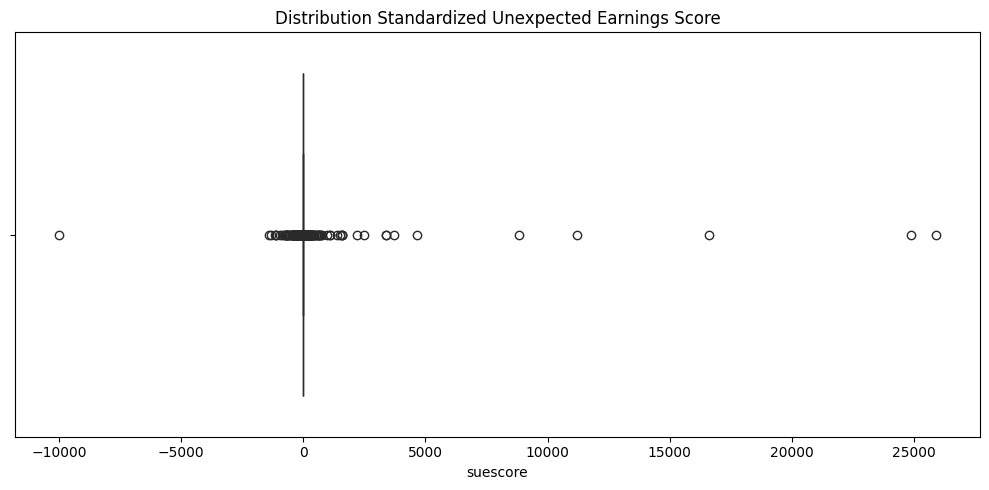

In [63]:
fig, ax = plt.subplots(figsize=(10,5))
sns.boxplot(data=surp_sum['suescore'], orient='h', color='darkred')
ax.set_title('Distribution Standardized Unexpected Earnings Score')
plt.tight_layout()
plt.show()

### Data Cleansing/Merge

#### Earnings Surprise Data
Below we are: 
- Converting "anndats" to a proper datetime, dropping any rows where it’s missing.
- Extracting the year from each announcement date, which we will use as a proxy for determining which data is consistent throughout.
- Filtering to keep only tickers that appear in every year of our date range   (year_beginning_filter through year_end_filter).
- Further ensuring each ticker has 4 quarters of data each year for consistently quarterly coverage.
- Removing any ticker that fails these conditions, leaving a final set of tickers meeting both the year coverage and 4-quarter criteria.
- Printing out the number of Investable universe of stocks for this dataset

In [64]:
# Cleaning the surprise Data
surp_sum['anndats'] = pd.to_datetime(surp_sum['anndats'], errors='coerce')
surp_sum = surp_sum[surp_sum['anndats'].notnull()]

surp_sum['year'] = surp_sum['anndats'].dt.year

years_required = set(range(year_beginning_filter, year_end_filter+1))

coverage = surp_sum.groupby('oftic')['year'].apply(set)
keep_tickers = coverage[coverage.apply(lambda x: years_required.issubset(x))].index
surp_sum = surp_sum[surp_sum['oftic'].isin(keep_tickers)]

quarter_counts = (
    surp_sum
    .groupby(['oftic', 'year'])
    .size()
    .reset_index(name='count_per_year')
)

quarter_counts_ok = quarter_counts[quarter_counts['count_per_year'] >= 4]

annual_coverage = quarter_counts_ok.groupby('oftic')['year'].apply(set)
keep_tickers_4q = annual_coverage[annual_coverage.apply(lambda x: years_required.issubset(x))].index

# Filtering out stocks that dont have 4 quarters of data for each year
surp_sum = surp_sum[surp_sum['oftic'].isin(keep_tickers_4q)]
surp_sum.drop(['ticker'], axis=1, inplace=True)
surp_sum['oftic'].nunique()

3040

##### Integrating Zack's Fundamental B Dataset
Below we are:
- Setting a market value threshold of $500 million to ensure our data stays above that amount throughout the entire date range.
- Calculating new metrics for use in rankings, P/E, EV/EBITDA, and YoY growth in revenue and price
- Ensuring we have consistent quarterly data for all the metrics below
- Printing out the unique amount of filters that pass these filters.
- We then filter the remaining tickers on what we have in the filtered surprise dataset to end up with 327 individual stocks that pass our criteria

In [65]:
zacks_cols = [
    'ticker',
    'per_end_date',
    'per_type',
    'tot_revnu',
    'eps_diluted_net',
    'basic_net_eps',
    'tot_lterm_debt',
    'net_lterm_debt',
    'net_curr_debt',
    'tot_debt_tot_equity',
    'ret_invst',
    'free_cash_flow_per_share',
    'ebitda',
    'shares_out',
    'mkt_val'
]

# Setting The Market Cap Threshold to Filter out Smaller Companies
mkt_cap_threshold = 500

# Selecting the metrics we plan to include in our strategy
zacks_df = zacks_data.loc[zacks_data.ticker.isin(top_tickers_list)].copy()
zacks_df = zacks_df[zacks_df['per_end_date'].notnull() & (zacks_df['per_type'] == 'Q')]
zacks_df.dropna(subset=zacks_cols, inplace=True)
zacks_df.sort_values(['ticker','per_end_date'], inplace=True)

zacks_df = zacks_df[zacks_df['per_end_date'].between(start_filing_date, end_filing_date)]

# Filtering Stocks to a smaller date range
zacks_df = zacks_df[zacks_df['per_end_date'].between(start_filter_date, end_filter_date)]
zacks_df['year'] = zacks_df['per_end_date'].dt.year


years_required = set(range(year_beginning_filter, year_end_filter + 1))
coverage = zacks_df.groupby('ticker')['year'].apply(set)
keep_tickers = coverage[coverage.apply(lambda s: years_required.issubset(s))].index
zacks_df = zacks_df[zacks_df['ticker'].isin(keep_tickers)]

zacks_df['ticker'].nunique()

266

In [66]:
# Filtering the surprise data on market cap requirement
valid_tickers = set(zacks_df['ticker'].unique())
surp_sum_filtered = surp_sum[surp_sum['oftic'].isin(valid_tickers)].reset_index(drop=True)

surp_sum_filtered['oftic'].nunique()

198

##### Transforming the primary final dataset
Below we are:
- Assign tickers to bins based on their avg_EPS to ensure we are comparing similar magnitudes of percent changes.
- We then transform the daily stock data obtained from the 'QUOTEMEDIA/PRICES' dataset to obtain the next day adjusted close and compute the return between those two days to capture the initial movement of the earnings surprise
- We merge these two datasets and bring in the relevant columns.
- The avg_eps_estimate is then calculated from subtracting the surprise mean from the actual EPS.
- Pct_surprise is calculated as the (average surprise)/ (the next day return)
- We then calculate the primary metric 'surprise_vs_move' which is simply the pct_surprise/(next day return). This should help us gauge how much the stock moved relative to it's surprise number
- The data is then translated into a z-score subtracting the mean of the bin it is in as well as dividing by the standard deviation of the same bin.

In [67]:
# Bin Strategy-Related
# Separating the Surprises into Bins
surp_sum_bins = surp_sum_filtered.copy()
surp_sum_bins['avg_eps'] = surp_sum_bins.groupby('oftic')['actual'].transform('mean')
bins = [-np.inf, 0, 0.5, 1, 2,  np.inf]
labels = [
    "Negative",
    "0 to 0.5",
    "0.5 to 1.0",
    "1.0 to 2.0",
    ">2.0"
]
surp_sum_bins['avg_eps_bin'] = pd.cut(surp_sum_bins['avg_eps'], bins=bins, labels=labels)
surp_sum_bins.groupby('avg_eps_bin')['oftic'].nunique()

avg_eps_bin
Negative       9
0 to 0.5      41
0.5 to 1.0    63
1.0 to 2.0    53
>2.0          32
Name: oftic, dtype: int64

In [68]:
# Bin Strategy-Related
# Drop columns 'surpstdev' and 'suescore'
surp_sum_bins.drop(columns=['surpstdev', 'suescore'], inplace=True, errors='ignore')

# Count NaN rows by ticker
mask_na = surp_sum_bins.isna().any(axis=1)
na_by_ticker = (
    surp_sum_bins[mask_na]
    .groupby('oftic')
    .size()
    .sort_values(ascending=False)
)
print("\nNaN counts by ticker:")
print(na_by_ticker)

# Tickers to drop (any ticker having at least one NaN row)
tickers_with_na = na_by_ticker.index
print("\nTickers to drop (due to NaNs):")
print(tickers_with_na.tolist())

# Drop all rows belonging to those tickers
surp_sum_bins = surp_sum_bins[~surp_sum_bins['oftic'].isin(tickers_with_na)]
surp_sum_bins['oftic'].nunique()


NaN counts by ticker:
oftic
SON    6
PRU    4
SCI    2
G      1
PG     1
SEM    1
SO     1
WES    1
dtype: int64

Tickers to drop (due to NaNs):
['SON', 'PRU', 'SCI', 'G', 'PG', 'SEM', 'SO', 'WES']


190

In [69]:
# Bin Strategy-Related 
# Sorting close prices for merge
eod_data = top_eod_data.copy()

# Creating the next day close price and next day return
eod_data = eod_data[eod_data['adj_close'] != 0]
eod_data['next_close'] = eod_data.groupby('ticker')['adj_close'].shift(-1)
eod_data['next_day_return'] = (
    eod_data['next_close'] / eod_data['adj_close'] - 1
)

# Adding an epsilon, to still rank stocks with no price movement 
epsilon = 1e-6
eod_data["next_day_return"] = (eod_data["next_day_return"] + epsilon)

eod_data['date'] = pd.to_datetime(eod_data['date'])
surp_sum_bins['anndats'] = pd.to_datetime(surp_sum_bins['anndats'])

# Merging the surprise bin data with the EOD data
surp_sum_bins_merged = surp_sum_bins.merge(
    eod_data[['ticker','date','adj_close','next_close','next_day_return']],
    how='left',
    left_on=['oftic','anndats'],
    right_on=['ticker','date']
)

In [70]:
# Bin-Strategy Related
mask_any_bad = (
    surp_sum_bins_merged.isna().any(axis=1) |
    (surp_sum_bins_merged == np.inf).any(axis=1) |
    (surp_sum_bins_merged == -np.inf).any(axis=1)
)

rows_with_issues = surp_sum_bins_merged[mask_any_bad]
tickers_with_issues = rows_with_issues['oftic'].unique()

print("Number of rows with NaNs or infinite values:", rows_with_issues.shape[0])
print("Total rows in surp_sum_merged:", surp_sum_bins_merged.shape[0])
print("Number of tickers with at least one NaN or infinite value:", len(tickers_with_issues))
print("Tickers with issues:", tickers_with_issues)

print("\nCounts of NaN rows by ticker (descending):")
mask_na = surp_sum_bins_merged.isna().any(axis=1)
na_by_ticker = (
    surp_sum_bins_merged[mask_na]
    .groupby('oftic')
    .size()
    .sort_values(ascending=False)
)
print(na_by_ticker)

print("\nCounts of infinite rows by ticker (descending):")
mask_inf = ((surp_sum_bins_merged == np.inf) | (surp_sum_bins_merged == -np.inf)).any(axis=1)
inf_by_ticker = (
    surp_sum_bins_merged[mask_inf]
    .groupby('oftic')
    .size()
    .sort_values(ascending=False)
)
print(inf_by_ticker)

surp_sum_bins_merged = surp_sum_bins_merged[~surp_sum_bins_merged['oftic'].isin(tickers_with_issues)]
print("\nRemaining rows:", surp_sum_bins_merged.shape[0])
print("Remaining tickers:", surp_sum_bins_merged['oftic'].nunique())

Number of rows with NaNs or infinite values: 44
Total rows in surp_sum_merged: 6008
Number of tickers with at least one NaN or infinite value: 12
Tickers with issues: ['SPG' 'AEP' 'KAR' 'ENR' 'RBA' 'CE' 'CVX' 'EVTC' 'MOG.A' 'MOS' 'PLOW'
 'XRAY']

Counts of NaN rows by ticker (descending):
oftic
MOG.A    28
SPG       4
PLOW      3
AEP       1
CE        1
CVX       1
ENR       1
EVTC      1
KAR       1
MOS       1
RBA       1
XRAY      1
dtype: int64

Counts of infinite rows by ticker (descending):
Series([], dtype: int64)

Remaining rows: 5551
Remaining tickers: 178


In [71]:
# Bin-Strategy Related
# Calculating avg_estimate
surp_sum_bins_merged['eps_estimate'] = surp_sum_bins_merged['actual'] - surp_sum_bins_merged['surpmean']

# Dropping rows where EPS estimate is 0, due to infinite values in pct_surprise calculation
surp_sum_bins_merged = surp_sum_bins_merged[surp_sum_bins_merged['eps_estimate'] != 0]

# Calculating percent surprise
surp_sum_bins_merged['pct_surprise'] = (
    surp_sum_bins_merged['surpmean'] / surp_sum_bins_merged['eps_estimate']
)

# Creating a metric to estimate the drift available
surp_sum_bins_merged['surprise_vs_move'] = (
    surp_sum_bins_merged['pct_surprise'] / surp_sum_bins_merged['next_day_return']
)
surp_sum_bins_merged['surprise_vs_move'] = surp_sum_bins_merged['surprise_vs_move']

surp_sum_bins_merged['zscore_surprise_vs_move'] = (
    surp_sum_bins_merged
    .groupby('avg_eps_bin')['surprise_vs_move']
    .transform(lambda x: (x - x.mean()) / x.std())
)
surp_sum_bins_merged.head()

,oftic,measure,fiscalp,pyear,pmon,usfirm,anndats,actual,surpmean,year,avg_eps,avg_eps_bin,ticker,date,adj_close,next_close,next_day_return,eps_estimate,pct_surprise,surprise_vs_move,zscore_surprise_vs_move
27,VMC,EPS,QTR,2021.0,12.0,0,2022-03-30,-0.120,-0.10000,2022,0.967378,0.5 to 1.0,VMC,2022-03-30,182.948210,179.604458,-0.018276,-0.02000,5.000000,-273.582220,-0.017114
28,VMC,EPS,QTR,2022.0,3.0,0,2022-05-16,-0.080,-0.11000,2022,0.967378,0.5 to 1.0,VMC,2022-05-16,156.559945,161.204045,0.029664,0.03000,-3.666667,-123.604956,-0.017104
29,VMC,EPS,QTR,2022.0,6.0,0,2022-08-15,-0.120,-0.08000,2022,0.967378,0.5 to 1.0,VMC,2022-08-15,174.367074,175.229549,0.004947,-0.04000,2.000000,404.259180,-0.017070
30,VMC,EPS,QTR,2022.0,9.0,0,2022-11-15,-0.248,0.02000,2022,0.967378,0.5 to 1.0,VMC,2022-11-15,173.178237,174.054465,0.005061,-0.26800,-0.074627,-14.746373,-0.017097
31,VMC,EPS,QTR,2022.0,12.0,0,2023-03-30,-0.080,-0.10844,2023,0.967378,0.5 to 1.0,VMC,2023-03-30,167.902103,169.303425,0.008347,0.02844,-3.812940,-456.799866,-0.017126


In [72]:
# Bin-Strategy Related
zacks_df['valid_from'] = zacks_df['filing_date'] + pd.Timedelta(days=1)
zacks_cols = [
    'ticker',
    'filing_date',
    'per_end_date',
    'per_type',
    'tot_revnu',
    'eps_diluted_net',
    'basic_net_eps',
    'tot_lterm_debt',
    'net_lterm_debt',
    'net_curr_debt',
    'tot_debt_tot_equity',
    'ret_invst',
    'free_cash_flow_per_share',
    'ebitda',
    'shares_out',
    'mkt_val',
    'valid_from'
]

fund_data = zacks_df[zacks_cols].copy()

surp_bins_filtered = surp_sum_bins_merged.copy()
surp_bins_filtered['announcement_plus_1'] = surp_bins_filtered['anndats'] + pd.Timedelta(days=1)

# Storing columns we need for analysis
surp_cols = [
    'oftic', 'adj_close', 'anndats','announcement_plus_1','pct_surprise',
    'eps_estimate','avg_eps_bin','zscore_surprise_vs_move'
]
surp_bins_filtered = surp_bins_filtered[surp_cols].copy()
surp_bins_filtered = surp_bins_filtered.rename(columns={'oftic': 'ticker'})
surp_bins_sorted = surp_bins_filtered.sort_values(by="announcement_plus_1")
fund_data_sorted = fund_data.sort_values(by="valid_from")

merged = pd.merge_asof(
    left=surp_bins_sorted,
    right=fund_data_sorted,
    left_on="announcement_plus_1",
    right_on="valid_from",
    by="ticker",            
    direction="backward"    
)


# Calculating the trade day as the later of the two dates.
merged['trade_day'] = merged[['valid_from','announcement_plus_1']].max(axis=1)

# Dropping rows that did not find a matching filing date
surp_bins_final = merged.dropna(subset=['filing_date'])
surp_bins_final.head()

,ticker,adj_close,anndats,announcement_plus_1,pct_surprise,eps_estimate,avg_eps_bin,zscore_surprise_vs_move,filing_date,per_end_date,per_type,tot_revnu,eps_diluted_net,basic_net_eps,tot_lterm_debt,net_lterm_debt,net_curr_debt,tot_debt_tot_equity,ret_invst,free_cash_flow_per_share,ebitda,shares_out,mkt_val,valid_from,trade_day
335,ABT,53.026088,2018-05-07,2018-05-08,0.909612,0.01571,0.5 to 1.0,-0.017102,2018-05-03,2018-03-31,Q,7390.0,0.23,0.23,21154.0,-5979.0,6.0,0.6927,0.7753,0.4719,1492.0,1753.19,105051.15,2018-05-04,2018-05-08
379,BA,331.670987,2018-05-14,2018-05-15,3.000000,0.08500,Negative,0.024438,2018-04-26,2018-03-31,Q,23382.0,4.15,4.19,10471.0,-1371.0,2687.0,9.5932,21.0468,4.6421,3392.0,582.58,191016.66,2018-04-27,2018-05-15
380,GS,211.295546,2018-05-14,2018-05-15,13.000000,0.01500,>2.0,-0.032153,2018-05-05,2018-03-31,Q,10080.0,6.95,7.02,225899.0,5402.0,5603.0,6.4102,0.9151,-3.8598,3718.0,377.72,95132.06,2018-05-06,2018-05-15
382,HUM,276.293093,2018-05-16,2018-05-17,-3.428571,-0.35000,>2.0,-0.032024,2018-05-03,2018-03-31,Q,14279.0,3.53,3.56,4772.0,245.0,-17.0,0.5251,3.3057,25.5853,899.0,137.68,37013.05,2018-05-04,2018-05-17
385,BG,57.607275,2018-05-24,2018-05-25,-11.149994,-0.08867,1.0 to 2.0,0.032540,2018-05-03,2018-03-31,Q,10641.0,-0.21,-0.21,5446.0,1264.0,984.0,0.9717,-0.1336,-13.3440,182.0,140.70,10403.36,2018-05-04,2018-05-25


In [73]:
# Metric Calculation
surp_bins_final['ps_ratio'] = surp_bins_final['mkt_val'] / surp_bins_final['tot_revnu']
surp_bins_final['net_debt_to_ebitda'] = (surp_bins_final['net_lterm_debt'] + surp_bins_final['net_curr_debt']) / surp_bins_final['ebitda']
surp_bins_final['revenue_growth'] = surp_bins_final.groupby('ticker')['tot_revnu'].pct_change(4)
surp_bins_final['ebitda_growth'] = surp_bins_final.groupby('ticker')['ebitda'].pct_change(4)
surp_bins_final['mkt_cap_growth'] = surp_bins_final.groupby('ticker')['mkt_val'].pct_change(4)

In [74]:
# Bin-Strategy Related
# List of fundamental metrics to compute z-scores for, by avg_eps_bin
fund_metrics =     ['ps_ratio',
    'net_debt_to_ebitda',
    'revenue_growth',
    'ebitda_growth',
    'mkt_cap_growth']

# Getting rid of first 4 na values in pct_change
surp_bins_final = (
    surp_bins_final
    .groupby('ticker', group_keys=False)
    .apply(lambda g: g.iloc[4:])
    .reset_index(drop=True)
)

for metric in fund_metrics:
    surp_bins_final[metric + '_bin_z'] = surp_bins_final.groupby('avg_eps_bin')[metric].transform(
        lambda x: (x - x.mean()) / x.std()
    )

In [ ]:
# Calculating Different Metrics
surp_bins_final['ps_ratio'] = surp_bins_final['mkt_val'] / surp_bins_final['tot_revnu']
surp_bins_final['net_debt_to_ebitda'] = (surp_bins_final['net_lterm_debt'] + surp_bins_final['net_curr_debt']) / surp_bins_final['ebitda']
surp_bins_final['revenue_growth'] = surp_bins_final.groupby('ticker')['tot_revnu'].pct_change(4)
surp_bins_final['ebitda_growth'] = surp_bins_final.groupby('ticker')['ebitda'].pct_change(4)
surp_bins_final['mkt_cap_growth'] = surp_bins_final.groupby('ticker')['mkt_val'].pct_change(4)

In [76]:
# Sorting close prices for merge
eod_data = top_eod_data.loc[top_eod_data.ticker.isin(surp_sum_filtered['oftic'].unique())].copy().reset_index(drop=True)

eod_data['date'] = pd.to_datetime(eod_data['date'])
surp_sum_filtered['anndats'] = pd.to_datetime(surp_sum_filtered['anndats'])

# Merging the surprise data with the EOD data
eod_surp_merged = pd.merge(
    eod_data[['ticker','date','adj_close']],
    surp_sum_filtered,
    how='left',
    left_on=['ticker','date'],
    right_on=['oftic','anndats']    
)

eod_surp_merged = eod_surp_merged.set_index(['ticker', 'date']).groupby(level=0).ffill().reset_index()

In [77]:
display(eod_surp_merged.head())
display(eod_surp_merged.tail())

,ticker,date,adj_close,oftic,measure,fiscalp,pyear,pmon,usfirm,anndats,actual,surpmean,surpstdev,suescore,year
0,AAOI,2018-01-02,37.91,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN
1,AAOI,2018-01-03,37.89,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN
2,AAOI,2018-01-04,38.38,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN
3,AAOI,2018-01-05,38.89,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN
4,AAOI,2018-01-08,38.37,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN


,ticker,date,adj_close,oftic,measure,fiscalp,pyear,pmon,usfirm,anndats,actual,surpmean,surpstdev,suescore,year
347083,ZG,2024-12-24,73.80,ZG,EPS,QTR,2024.0,9.0,1.0,2024-11-06,0.35,0.29238,0.02318,2.48567,2024.0
347084,ZG,2024-12-26,73.66,ZG,EPS,QTR,2024.0,9.0,1.0,2024-11-06,0.35,0.29238,0.02318,2.48567,2024.0
347085,ZG,2024-12-27,72.74,ZG,EPS,QTR,2024.0,9.0,1.0,2024-11-06,0.35,0.29238,0.02318,2.48567,2024.0
347086,ZG,2024-12-30,71.30,ZG,EPS,QTR,2024.0,9.0,1.0,2024-11-06,0.35,0.29238,0.02318,2.48567,2024.0
347087,ZG,2024-12-31,70.85,ZG,EPS,QTR,2024.0,9.0,1.0,2024-11-06,0.35,0.29238,0.02318,2.48567,2024.0


##### Merging the Fundamentals and Surprise Data
Below we are:
- Transforming the fundamental data and Earnings Surprise to ensure that we have a latest date for both to avoid lookahead bias in trades. To be safe we assume we are only available to trade on this information after the announcement and filing date.
- Both of the datasets are then merged on 'ticker' and 'oftic'.
- Trade day is then calculated as the latest day between the two announcements
- Calculate Z_scores for new metrics within bins
- We then drop incomplete rows and features for a final cleanup.

In [78]:
surp_data = eod_surp_merged.copy()

surp_data_sorted = surp_data.sort_values(by="date")
fund_data_sorted = fund_data.sort_values(by="valid_from")

merged_df = pd.merge(
    surp_data_sorted,
    fund_data_sorted,
    how='left',
    left_on=['ticker','date'],
    right_on=['ticker','valid_from']    
)

merged_df = merged_df.set_index(['ticker', 'date']).groupby(level=0).ffill().reset_index()

In [79]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 347088 entries, 0 to 347087
Data columns (total 31 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   ticker                    347088 non-null  object        
 1   date                      347088 non-null  datetime64[ns]
 2   adj_close                 347088 non-null  float64       
 3   oftic                     341602 non-null  object        
 4   measure                   341602 non-null  object        
 5   fiscalp                   341602 non-null  object        
 6   pyear                     341602 non-null  float64       
 7   pmon                      341602 non-null  float64       
 8   usfirm                    341602 non-null  float64       
 9   anndats                   341602 non-null  datetime64[ns]
 10  actual                    341552 non-null  float64       
 11  surpmean                  341602 non-null  float64       
 12  su

In [80]:
# Identifying tickers that have missing rev_yoy_growth or price_yoy_growth
tickers_with_na = (
    merged_df
    .loc[(merged_df.isna().any(axis=1)) & (merged_df.date>=data_start_date) & (merged_df.date<=data_end_date), 'ticker']
    .unique()
)

# # Dropping all rows belonging to these tickers
merged_df = merged_df[~merged_df['ticker'].isin(tickers_with_na)]

In [81]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 230793 entries, 0 to 347087
Data columns (total 31 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   ticker                    230793 non-null  object        
 1   date                      230793 non-null  datetime64[ns]
 2   adj_close                 230793 non-null  float64       
 3   oftic                     227056 non-null  object        
 4   measure                   227056 non-null  object        
 5   fiscalp                   227056 non-null  object        
 6   pyear                     227056 non-null  float64       
 7   pmon                      227056 non-null  float64       
 8   usfirm                    227056 non-null  float64       
 9   anndats                   227056 non-null  datetime64[ns]
 10  actual                    227056 non-null  float64       
 11  surpmean                  227056 non-null  float64       
 12  surpstd

In [82]:
display(merged_df.describe())
display(merged_df.info())

,date,adj_close,pyear,pmon,usfirm,anndats,actual,surpmean,surpstdev,suescore,year,filing_date,per_end_date,tot_revnu,eps_diluted_net,basic_net_eps,tot_lterm_debt,net_lterm_debt,net_curr_debt,tot_debt_tot_equity,ret_invst,free_cash_flow_per_share,ebitda,shares_out,mkt_val,valid_from
count,230793,230793.000000,227056.000000,227056.000000,227056.000000,227056,227056.000000,227056.000000,227056.000000,227056.000000,227056.000000,215507,215507,215507.000000,215507.000000,215507.000000,215507.000000,215507.000000,215507.000000,215507.00000,215507.000000,215507.000000,215507.000000,215507.000000,2.155070e+05,215507
mean,2021-07-01 15:52:07.930222848,84.531270,2020.732542,7.364426,0.951527,2021-06-07 20:54:11.060531200,1.162991,1.085164,0.088463,1.472103,2020.952853,2021-03-23 01:35:46.716347648,2021-02-12 16:46:07.382962176,4185.306542,0.738093,0.743367,9290.449244,363.661610,106.300230,2.23135,1.795017,1.895659,858.227776,468.179294,4.452333e+04,2021-03-24 01:35:46.716347392
min,2018-01-02 00:00:00,1.040000,2017.000000,3.000000,0.000000,2018-01-18 00:00:00,-10.440000,-10.523750,0.000000,-94.046100,2018.000000,2018-04-18 00:00:00,2018-03-31 00:00:00,-357.000000,-20.960000,-20.960000,0.021000,-17199.000000,-22642.000000,-611.65000,-29.669200,-34.148800,-19305.000000,12.110000,5.410000e+01,2018-04-19 00:00:00
25%,2019-10-02 00:00:00,29.746410,2019.000000,3.000000,1.000000,2019-10-16 00:00:00,0.400000,0.366520,0.023940,-0.169740,2019.000000,2019-08-08 00:00:00,2019-06-30 00:00:00,677.186000,0.210000,0.210000,1369.085000,-42.736000,-90.000000,0.62810,0.568000,-0.483900,87.621000,67.810000,2.912230e+03,2019-08-09 00:00:00
50%,2021-07-01 00:00:00,55.357913,2021.000000,6.000000,1.000000,2021-05-10 00:00:00,0.830000,0.765250,0.045860,1.032790,2021.000000,2021-01-27 00:00:00,2020-12-31 00:00:00,1566.000000,0.690000,0.700000,3444.000000,-0.039000,0.640000,1.15280,1.628400,0.997400,257.000000,156.680000,8.446550e+03,2021-01-28 00:00:00
75%,2023-03-31 00:00:00,109.348683,2022.000000,9.000000,1.000000,2023-02-22 00:00:00,1.530000,1.461180,0.098070,2.788590,2023.000000,2022-11-02 00:00:00,2022-09-30 00:00:00,4075.000000,1.310000,1.320000,10171.000000,511.000000,138.000000,1.93300,3.133600,3.181600,851.000000,384.350000,2.739779e+04,2022-11-03 00:00:00
max,2024-12-31 00:00:00,958.350400,2024.000000,12.000000,1.000000,2024-11-14 00:00:00,17.180000,12.894400,3.795910,366.978960,2024.000000,2024-11-21 00:00:00,2024-09-30 00:00:00,91819.000000,16.280000,16.280000,105752.000000,27380.000000,48256.900000,459.48030,37.681200,92.216200,28385.000000,19319.720000,2.263972e+06,2024-11-22 00:00:00
std,NaN,87.820423,2.015266,3.279165,0.214763,NaN,1.455880,1.323152,0.163909,6.761429,1.977999,NaN,NaN,8577.980031,2.266686,2.288064,15276.599206,2032.079615,2370.809632,18.63034,5.280599,6.922509,2461.162076,1534.061034,1.674190e+05,NaN


<class 'pandas.core.frame.DataFrame'>
Index: 230793 entries, 0 to 347087
Data columns (total 31 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   ticker                    230793 non-null  object        
 1   date                      230793 non-null  datetime64[ns]
 2   adj_close                 230793 non-null  float64       
 3   oftic                     227056 non-null  object        
 4   measure                   227056 non-null  object        
 5   fiscalp                   227056 non-null  object        
 6   pyear                     227056 non-null  float64       
 7   pmon                      227056 non-null  float64       
 8   usfirm                    227056 non-null  float64       
 9   anndats                   227056 non-null  datetime64[ns]
 10  actual                    227056 non-null  float64       
 11  surpmean                  227056 non-null  float64       
 12  surpstd

None

In [83]:
# merged_df.to_parquet('../data/merged_data.parquet')
# merged_df = pd.read_parquet('../data/merged_data.parquet')

## **Feature Engineering**

To capture disposition effect and underreaction to news, we will constrcut factors incorporating fundamental, earnings, and price data.

1. Disposition Effect Signals
- Capital Gains Overhang:
    - Compute unrealized capital gains/losses using mutual fund holdings (due to limited data we are using a reference price instaed) and stock price history.
    - $CGO = (Current Price - Weighted Average Purchase Price) / Current Price$
    - Stocks with large unrealized losses tend to underreact to bad news.
- Realized vs. Unrealized Gains Ratio:
    - High values: Investors aggressively taking profits (possible reversal).
    - Low values: Investors reluctant to realize losses (potential underreaction).

2. PEAD Signals
- Earnings Surprise (SUE - Standardized Unexpected Earnings):
    - $SUE = (Actual\ EPS - Expected\ EPS) / Std\ of\ EPS\ Estimates$
    - Higher SUE: Stronger PEAD effects
- Earnings Drift Factor:
    - Stocks with high past earnings surprise but low short-term reaction may exhibit PEAD.
    - Compute cumulative abnormal returns (CAR) post-earnings
        - We will test different window lengths (5-day, 30-day, etc)

3. Momentum & Technical Signals
- N-Month Momentum: Stocks with strong past N-month returns tend to continue moving in the same direction.
- Relative Strength Index: Captures overbought/oversold condition
    - We will test different windows here
- Short-Term Reversals: Compute N-week return to detect extreme short-term movements

4. Fundamentals


\begin{array}{|l|l|l|}
\hline
\textbf{Feature Name} & \textbf{Definition} & \textbf{Purpose} \\
\hline
ps\ ratio & \text{Market Value / Total Revenue} & \text{Valuation} \\
earnings\ yield & \text{EPS / Market Value per Share} & \text{Valuation} \\
fcf\ yield & \text{Free Cash Flow per Share / Market Value per Share} & \text{Valuation} \\
ebitda\ margin & \text{EBITDA / Total Revenue} & \text{Profitability} \\
roi\ scaled & \text{Return on Investment} & \text{Profitability} \\
eps\ growth & \text{YoY EPS Growth} & \text{Growth} \\
debt\ to\ equity & \text{Total Debt / Total Equity} & \text{Leverage} \\
net\ debt\ to\ ebitda & \text{(Net LT Debt + Net Current Debt) / EBITDA} & \text{Leverage} \\
debt\ to\ revenue & \text{Total LT Debt / Total Revenue} & \text{Leverage} \\
revenue\ growth & \text{YoY Revenue Growth} & \text{Growth} \\
ebitda\ growth & \text{YoY EBITDA Growth} & \text{Growth} \\
mkt\ cap\ growth & \text{YoY Market Cap Growth} & \text{Growth} \\
log\ mkt\ cap & \text{Log of Market Cap} & \text{Size Indicator} \\
fcf\ growth & \text{YoY Free Cash Flow Growth} & \text{Growth} \\
\hline
\end{array}

In [84]:
display(merged_df.head())
display(merged_df.tail())

,ticker,date,adj_close,oftic,measure,fiscalp,pyear,pmon,usfirm,anndats,actual,surpmean,surpstdev,suescore,year,filing_date,per_end_date,per_type,tot_revnu,eps_diluted_net,basic_net_eps,tot_lterm_debt,net_lterm_debt,net_curr_debt,tot_debt_tot_equity,ret_invst,free_cash_flow_per_share,ebitda,shares_out,mkt_val,valid_from
0,AAOI,2018-01-02,37.910000,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
1,BCO,2018-01-02,74.114266,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
2,SON,2018-01-02,42.942827,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
4,EIX,2018-01-02,47.629823,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT
5,APLE,2018-01-02,14.272789,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT


,ticker,date,adj_close,oftic,measure,fiscalp,pyear,pmon,usfirm,anndats,actual,surpmean,surpstdev,suescore,year,filing_date,per_end_date,per_type,tot_revnu,eps_diluted_net,basic_net_eps,tot_lterm_debt,net_lterm_debt,net_curr_debt,tot_debt_tot_equity,ret_invst,free_cash_flow_per_share,ebitda,shares_out,mkt_val,valid_from
347080,CPK,2024-12-31,121.35,CPK,EPS,QTR,2024.0,9.0,1.0,2024-11-07,0.78,0.67114,0.07040,1.54631,2024.0,2024-05-09,2024-03-31,Q,245.744,2.07,2.07,1185.166,-1.973,-9.498,1.0727,1.8721,0.9872,100.510,22.27,2389.29,2024-05-10
347081,R,2024-12-31,156.86,R,EPS,QTR,2024.0,9.0,1.0,2024-10-24,3.44,3.42286,0.05122,0.33467,2024.0,2024-04-24,2024-03-31,Q,3098.000,1.89,1.89,6802.000,133.000,288.000,2.4610,0.8615,0.2889,639.000,43.83,5267.78,2024-04-25
347083,PZZA,2024-12-31,41.07,PZZA,EPS,QTR,2024.0,9.0,1.0,2024-11-07,0.43,0.42863,0.02825,0.04867,2024.0,2020-05-07,2020-03-31,Q,409.859,0.15,0.15,350.166,-5.000,0.640,-1.1422,37.6812,0.8602,27.767,32.47,1732.73,2020-05-08
347084,CVNA,2024-12-31,203.36,CVNA,EPS,QTR,2024.0,9.0,1.0,2024-10-30,0.64,0.24153,0.12457,3.19882,2024.0,2024-10-31,2024-09-30,Q,3655.000,0.64,0.69,5431.000,-267.000,-592.000,19.9860,2.5888,5.9900,414.000,207.63,36150.42,2024-11-01
347087,ZG,2024-12-31,70.85,ZG,EPS,QTR,2024.0,9.0,1.0,2024-11-06,0.35,0.29238,0.02318,2.48567,2024.0,2024-11-07,2024-09-30,Q,581.000,-0.08,-0.08,497.000,-697.000,55.000,0.2283,-0.3881,0.8472,26.000,233.56,14464.32,2024-11-08


In [85]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 230793 entries, 0 to 347087
Data columns (total 31 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   ticker                    230793 non-null  object        
 1   date                      230793 non-null  datetime64[ns]
 2   adj_close                 230793 non-null  float64       
 3   oftic                     227056 non-null  object        
 4   measure                   227056 non-null  object        
 5   fiscalp                   227056 non-null  object        
 6   pyear                     227056 non-null  float64       
 7   pmon                      227056 non-null  float64       
 8   usfirm                    227056 non-null  float64       
 9   anndats                   227056 non-null  datetime64[ns]
 10  actual                    227056 non-null  float64       
 11  surpmean                  227056 non-null  float64       
 12  surpstd

In [86]:
# Define window for reference price
window = 65

# Compute rolling average price (proxy for purchase price)
merged_df['ref_price'] = merged_df.groupby('ticker')['adj_close'].transform(lambda x: x.rolling(window).mean())

# Compute Capital Gains Overhang
merged_df['cgo'] = (merged_df['adj_close'] - merged_df['ref_price']) / merged_df['adj_close']

In [87]:
# Define rolling window lengths
momentum_windows = [21, 126, 252]  # 1-month, 6-month, 12-month

# Compute momentum factors (log returns)
for window in momentum_windows:
    merged_df[f'mom_{window}'] = merged_df.groupby('ticker')['adj_close'].transform(lambda x: np.log(x / x.shift(window)))

# Compute short-term reversal (1-week return)
merged_df['short_term_reversal'] = merged_df.groupby('ticker')['adj_close'].transform(lambda x: np.log(x / x.shift(5)))

In [88]:
# Compute cumulative abnormal return (CAR) post earnings
windows = [5, 20]  # 5-day and 30-day drift

for w in windows:
    merged_df[f'pead_{w}d'] = merged_df.groupby('ticker')['adj_close'].transform(lambda x: x.pct_change(w))

In [89]:
merged_df['ps_ratio'] = merged_df['mkt_val'] / merged_df['tot_revnu']
merged_df['earnings_yield'] = merged_df['eps_diluted_net'] / (merged_df['mkt_val'] / merged_df['shares_out'])
merged_df['fcf_yield'] = merged_df['free_cash_flow_per_share'] / (merged_df['mkt_val'] / merged_df['shares_out'])
merged_df['ebitda_margin'] = merged_df['ebitda'] / merged_df['tot_revnu']
merged_df['roi_scaled'] = merged_df['ret_invst'] / 100
merged_df['eps_growth'] = merged_df.groupby('ticker')['eps_diluted_net'].pct_change(4)
merged_df['net_debt_to_ebitda'] = (merged_df['net_lterm_debt'] + merged_df['net_curr_debt']) / merged_df['ebitda']
merged_df['debt_to_revenue'] = merged_df['tot_lterm_debt'] / merged_df['tot_revnu']
merged_df['revenue_growth'] = merged_df.groupby('ticker')['tot_revnu'].pct_change(4)
merged_df['ebitda_growth'] = merged_df.groupby('ticker')['ebitda'].pct_change(4)
merged_df['mkt_cap_growth'] = merged_df.groupby('ticker')['mkt_val'].pct_change(4)
merged_df['log_mkt_cap'] = np.log(merged_df['mkt_val'])
merged_df['fcf_growth'] = merged_df.groupby('ticker')['free_cash_flow_per_share'].pct_change(4)

In [90]:
prediction_target_windows = [5, 20, 60]
feature_importance_dict = {}

for w in prediction_target_windows:
    prediction_target_window = w
    merged_df[f'target_return_{w}_day'] = merged_df.groupby('ticker')['adj_close'].pct_change(w)
    merged_df[f'target_return_{w}_day'] = merged_df.groupby('ticker')[f'target_return_{w}_day'].shift(-w)

In [91]:
merged_df['day_after_earnings']= merged_df.groupby(['ticker', 'anndats'])['date'].nth(1)
merged_df['day_after_earnings'] = merged_df.groupby('ticker')['day_after_earnings'].ffill()
merged_df['previous_day_return'] = merged_df.groupby('ticker')['adj_close'].pct_change()
merged_df[merged_df['ticker']=='AAPL'][['date','anndats', 'day_after_earnings']].tail(20)

,date,anndats,day_after_earnings
343230,2024-12-03,2024-10-31,2024-11-01
343469,2024-12-04,2024-10-31,2024-11-01
343583,2024-12-05,2024-10-31,2024-11-01
343924,2024-12-06,2024-10-31,2024-11-01
344045,2024-12-09,2024-10-31,2024-11-01
344311,2024-12-10,2024-10-31,2024-11-01
344349,2024-12-11,2024-10-31,2024-11-01
344710,2024-12-12,2024-10-31,2024-11-01
344781,2024-12-13,2024-10-31,2024-11-01
345041,2024-12-16,2024-10-31,2024-11-01


In [92]:
final_df = merged_df.loc[(merged_df['date']>=data_start_date) & (merged_df['date']<=data_end_date) & (merged_df['day_after_earnings']==merged_df['date'])].copy().reset_index(drop=True).sort_values(by=['ticker','date'])
trading_data = merged_df.loc[(merged_df['date']>=data_start_date) & (merged_df['date']<=data_end_date)].copy().reset_index(drop=True).sort_values(by=['ticker','date'])
final_df = final_df.dropna(subset=[f'target_return_{w}_day' for w in prediction_target_windows])
display(final_df.head())
display(final_df.tail())
display(final_df.describe())

,ticker,date,adj_close,oftic,measure,fiscalp,pyear,pmon,usfirm,anndats,actual,surpmean,surpstdev,suescore,year,filing_date,per_end_date,per_type,tot_revnu,eps_diluted_net,basic_net_eps,tot_lterm_debt,net_lterm_debt,net_curr_debt,tot_debt_tot_equity,ret_invst,free_cash_flow_per_share,ebitda,shares_out,mkt_val,valid_from,ref_price,cgo,mom_21,mom_126,mom_252,short_term_reversal,pead_5d,pead_20d,ps_ratio,earnings_yield,fcf_yield,ebitda_margin,roi_scaled,eps_growth,net_debt_to_ebitda,debt_to_revenue,revenue_growth,ebitda_growth,mkt_cap_growth,log_mkt_cap,fcf_growth,target_return_5_day,target_return_20_day,target_return_60_day,day_after_earnings,previous_day_return
105,AAOI,2019-02-22,15.42,AAOI,EPS,QTR,2018.0,12.0,1.0,2019-02-21,-0.02,-0.03778,0.03232,0.55009,2019.0,2018-08-09,2018-06-30,Q,87.822,0.40,0.41,57.868,25.463,-14.000,0.1781,2.0060,-0.6377,16.270,19.58,879.10,2018-08-10,17.092538,-0.108466,-0.049963,-0.968349,-0.806742,0.046458,0.047554,-0.077751,10.010020,0.008909,-0.014203,0.185261,0.020060,0.0,0.704548,0.658924,0.0,0.0,0.0,6.778899,0.0,-0.141375,-0.175746,-0.398833,2019-02-22,0.056164
265,AAOI,2019-05-09,10.93,AAOI,EPS,QTR,2019.0,3.0,1.0,2019-05-08,-0.27,-0.21667,0.01871,-2.85083,2019.0,2019-02-27,2018-12-31,Q,58.018,-0.43,-0.43,60.328,44.716,-5.896,0.2550,-2.2002,-2.9077,-4.344,19.80,305.49,2019-02-28,13.417231,-0.227560,-0.098383,-0.575821,-1.167544,-0.100867,-0.095947,-0.111382,5.265435,-0.027870,-0.188459,-0.074873,-0.022002,0.0,-8.936464,1.039815,0.0,0.0,0.0,5.721917,0.0,-0.111619,-0.130833,-0.103385,2019-05-09,-0.093698
406,AAOI,2019-08-08,10.90,AAOI,EPS,QTR,2019.0,6.0,1.0,2019-08-07,-0.26,-0.37333,0.01658,6.83431,2019.0,2019-02-27,2018-12-31,Q,58.018,-0.43,-0.43,60.328,44.716,-5.896,0.2550,-2.2002,-2.9077,-4.344,19.80,305.49,2019-02-28,9.608769,0.118462,0.055648,-0.372828,-1.228352,0.093202,0.097684,0.101010,5.265435,-0.027870,-0.188459,-0.074873,-0.022002,0.0,-8.936464,1.039815,0.0,0.0,0.0,5.721917,0.0,-0.185321,-0.055046,-0.122018,2019-08-08,0.067581
535,AAOI,2019-11-07,10.69,AAOI,EPS,QTR,2019.0,9.0,1.0,2019-11-06,-0.15,-0.23967,0.01769,5.06820,2019.0,2019-02-27,2018-12-31,Q,58.018,-0.43,-0.43,60.328,44.716,-5.896,0.2550,-2.2002,-2.9077,-4.344,19.80,305.49,2019-02-28,10.266077,0.039656,0.028465,-0.001869,-0.641312,0.132863,0.142094,0.052165,5.265435,-0.027870,-0.188459,-0.074873,-0.022002,0.0,-8.936464,1.039815,0.0,0.0,0.0,5.721917,0.0,0.019645,-0.029935,0.134705,2019-11-07,-0.087105
690,AAOI,2020-02-28,8.93,AAOI,EPS,QTR,2019.0,12.0,1.0,2020-02-27,-0.18,-0.23350,0.01634,3.27457,2020.0,2019-02-27,2018-12-31,Q,58.018,-0.43,-0.43,60.328,44.716,-5.896,0.2550,-2.2002,-2.9077,-4.344,19.80,305.49,2019-02-28,11.768462,-0.317857,-0.289640,0.029548,-0.413273,-0.233615,-0.208333,-0.233476,5.265435,-0.027870,-0.188459,-0.074873,-0.022002,0.0,-8.936464,1.039815,0.0,0.0,0.0,5.721917,0.0,-0.015677,-0.162374,0.003359,2020-02-28,-0.065900


,ticker,date,adj_close,oftic,measure,fiscalp,pyear,pmon,usfirm,anndats,actual,surpmean,surpstdev,suescore,year,filing_date,per_end_date,per_type,tot_revnu,eps_diluted_net,basic_net_eps,tot_lterm_debt,net_lterm_debt,net_curr_debt,tot_debt_tot_equity,ret_invst,free_cash_flow_per_share,ebitda,shares_out,mkt_val,valid_from,ref_price,cgo,mom_21,mom_126,mom_252,short_term_reversal,pead_5d,pead_20d,ps_ratio,earnings_yield,fcf_yield,ebitda_margin,roi_scaled,eps_growth,net_debt_to_ebitda,debt_to_revenue,revenue_growth,ebitda_growth,mkt_cap_growth,log_mkt_cap,fcf_growth,target_return_5_day,target_return_20_day,target_return_60_day,day_after_earnings,previous_day_return
2591,ZG,2023-08-03,53.55,ZG,EPS,QTR,2023.0,6.0,1.0,2023-08-02,0.39,0.17869,0.07052,2.99653,2023.0,2023-02-16,2022-12-31,Q,435.0,-0.31,-0.31,1660.0,-1158.0,-2282.0,0.3786,-1.1723,18.5781,-32.0,234.27,7311.5,2023-02-17,47.837077,0.106684,0.102770,0.200982,0.375390,0.043900,0.044878,0.156088,16.808046,-0.009933,0.595267,-0.073563,-0.011723,0.0,107.5,3.816092,0.0,0.0,0.0,8.897204,0.0,0.020542,-0.049113,-0.295425,2023-08-03,0.009806
2726,ZG,2023-11-02,34.74,ZG,EPS,QTR,2023.0,9.0,1.0,2023-11-01,0.33,0.21619,0.07884,1.44362,2023.0,2023-02-16,2022-12-31,Q,435.0,-0.31,-0.31,1660.0,-1158.0,-2282.0,0.3786,-1.1723,18.5781,-32.0,234.27,7311.5,2023-02-17,45.975231,-0.323409,-0.203258,-0.278138,0.115196,-0.070029,-0.067633,-0.181047,16.808046,-0.009933,0.595267,-0.073563,-0.011723,0.0,107.5,3.816092,0.0,0.0,0.0,8.897204,0.0,0.012953,0.198906,0.585780,2023-11-02,-0.029338
2860,ZG,2024-02-14,56.03,ZG,EPS,QTR,2023.0,12.0,1.0,2024-02-13,0.20,0.11647,0.05385,1.55129,2024.0,2023-02-16,2022-12-31,Q,435.0,-0.31,-0.31,1660.0,-1158.0,-2282.0,0.3786,-1.1723,18.5781,-32.0,234.27,7311.5,2023-02-17,49.715538,0.112698,0.091125,0.045832,0.238294,0.008604,0.008641,0.107531,16.808046,-0.009933,0.595267,-0.073563,-0.011723,0.0,107.5,3.816092,0.0,0.0,0.0,8.897204,0.0,-0.085311,-0.051580,-0.253971,2024-02-14,0.076258
2993,ZG,2024-05-02,39.19,ZG,EPS,QTR,2024.0,3.0,1.0,2024-05-01,0.36,0.32400,0.05510,0.65332,2024.0,2023-02-16,2022-12-31,Q,435.0,-0.31,-0.31,1660.0,-1158.0,-2282.0,0.3786,-1.1723,18.5781,-32.0,234.27,7311.5,2023-02-17,49.243538,-0.256533,-0.156954,0.098044,-0.072101,-0.078963,-0.075925,-0.144883,16.808046,-0.009933,0.595267,-0.073563,-0.011723,0.0,107.5,3.816092,0.0,0.0,0.0,8.897204,0.0,0.083440,0.024496,0.218423,2024-05-02,-0.054295
3188,ZG,2024-08-08,47.70,ZG,EPS,QTR,2024.0,6.0,1.0,2024-08-07,0.39,0.26909,0.02072,5.83679,2024.0,2023-02-16,2022-12-31,Q,435.0,-0.31,-0.31,1660.0,-1158.0,-2282.0,0.3786,-1.1723,18.5781,-32.0,234.27,7311.5,2023-02-17,44.604923,0.064886,0.036290,-0.152352,-0.148022,0.072142,0.074808,-0.013444,16.808046,-0.009933,0.595267,-0.073563,-0.011723,0.0,107.5,3.816092,0.0,0.0,0.0,8.897204,0.0,0.079665,0.080294,0.209015,2024-08-08,0.182156


,date,adj_close,pyear,pmon,usfirm,anndats,actual,surpmean,surpstdev,suescore,year,filing_date,per_end_date,tot_revnu,eps_diluted_net,basic_net_eps,tot_lterm_debt,net_lterm_debt,net_curr_debt,tot_debt_tot_equity,ret_invst,free_cash_flow_per_share,ebitda,shares_out,mkt_val,valid_from,ref_price,cgo,mom_21,mom_126,mom_252,short_term_reversal,pead_5d,pead_20d,ps_ratio,earnings_yield,fcf_yield,ebitda_margin,roi_scaled,eps_growth,net_debt_to_ebitda,debt_to_revenue,revenue_growth,ebitda_growth,mkt_cap_growth,log_mkt_cap,fcf_growth,target_return_5_day,target_return_20_day,target_return_60_day,day_after_earnings,previous_day_return
count,3212,3212.000000,3212.000000,3212.000000,3212.000000,3212,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212,3212,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3.212000e+03,3212,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3188.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212.000000,3212,3212.000000
mean,2021-11-04 15:03:48.642590464,88.298678,2021.130448,7.438356,0.916563,2021-11-03 12:57:49.987546624,1.188632,1.112928,0.098084,1.467945,2021.392590,2021-03-25 04:18:13.897883136,2021-02-14 01:26:31.531756032,4337.802781,0.755350,0.761398,9502.047706,376.660123,92.423542,2.109203,1.739156,2.029982,847.614298,471.077961,4.459238e+04,2021-03-26 04:18:13.897882880,86.916117,0.002480,0.022934,0.030936,0.053593,0.001355,0.004528,0.028513,9.459352,-0.001426,0.015701,0.198287,0.017392,-0.008208,1.009165,4.518694,0.000164,0.002628,0.000111,9.214078,-0.107002,0.005049,0.009568,0.033605,2021-11-04 15:03:48.642590464,0.000406
min,2019-01-18 00:00:00,1.340000,2018.000000,3.000000,0.000000,2019-01-18 00:00:00,-7.690000,-6.687140,0.000000,-94.046100,2019.000000,2018-04-18 00:00:00,2018-03-31 00:00:00,-357.000000,-20.960000,-20.960000,0.021000,-17199.000000,-22642.000000,-611.650000,-29.669200,-34.148800,-19305.000000,12.110000,5.410000e+01,2018-04-19 00:00:00,1.358923,-2.299473,-0.880498,-1.668826,-3.535551,-0.525560,-0.408776,-0.545407,-157.211092,-1.304158,-1.549965,-5.477647,-0.296692,-20.086957,-557.856644,-16.226891,-0.190122,-0.635753,-0.400198,3.990834,-329.400000,-0.584317,-0.802574,-0.801796,2019-01-18 00:00:00,-0.389547
25%,2020-05-07 00:00:00,30.143750,2020.000000,3.000000,1.000000,2020-05-06 00:00:00,0.390000,0.354598,0.025710,-0.218023,2020.000000,2019-10-31 00:00:00,2019-09-30 00:00:00,701.399000,0.207500,0.210000,1529.673000,-45.158500,-99.889000,0.626950,0.533300,-0.453400,94.111000,69.390000,3.080060e+03,2019-11-01 00:00:00,29.841543,-0.045877,-0.035464,-0.090220,-0.111774,-0.036859,-0.036188,-0.034899,3.389330,0.004362,-0.010095,0.103696,0.005333,0.000000,-0.427617,1.077189,0.000000,0.000000,0.000000,8.032704,0.000000,-0.021623,-0.042830,-0.063821,2020-05-07 00:00:00,-0.018927
50%,2021-11-03 00:00:00,57.646342,2021.000000,6.000000,1.000000,2021-11-02 00:00:00,0.830000,0.763720,0.050015,1.023515,2021.000000,2021-02-10 00:00:00,2020-12-31 00:00:00,1576.500000,0.690000,0.700000,3576.391500,4.325000,0.640000,1.162500,1.614650,1.030700,271.000000,156.340000,8.902010e+03,2021-02-11 00:00:00,56.788260,0.016465,0.022977,0.037287,0.060859,0.004058,0.004066,0.022100,6.976268,0.010566,0.016119,0.183620,0.016147,0.000000,0.241595,1.900009,0.000000,0.000000,0.000000,9.094032,0.000000,0.004214,0.011478,0.026136,2021-11-03 00:00:00,0.000000
75%,2023-04-28 00:00:00,113.298888,2023.000000,12.000000,1.000000,2023-04-27 00:00:00,1.540000,1.466565,0.107467,2.797480,2023.000000,2022-08-09 00:00:00,2022-06-30 00:00:00,4167.708250,1.300000,1.310000,10824.000000,640.900000,135.050000,1.894700,3.101575,3.198000,858.250000,388.660000,2.773289e+04,2022-08-10 00:00:00,112.841039,0.066655,0.081505,0.164695,0.228511,0.042379,0.043290,0.081312,12.548256,

In [93]:
req_cols = [
    'ticker',
    'date',
    'adj_close'
]
features = [
    'suescore',
    'cgo', 
    'mom_21', 'mom_126', 'mom_252','short_term_reversal', 
    'pead_5d', 'pead_20d', 
    'ps_ratio','earnings_yield', 'fcf_yield', 'ebitda_margin', 'roi_scaled',
    'net_debt_to_ebitda', 'debt_to_revenue', 'revenue_growth',
    'ebitda_growth', 'mkt_cap_growth', 'log_mkt_cap', 'fcf_growth'
]

<h1><b><u> Bin Strategy </h2>

<h2> Adjusting Initial Strategy Parameters:<i> Bin Aware/Not Bin Aware - Quantiles


<h4> Binned/Standardized Quantile Strategy Overview </h4>
This strategy begins by computing a factor that combines multiple signals—primarily the post-earnings “surprise vs. price move” metric and optionally additional fundamentals such as P/S ratio, net debt/EBITDA, revenue growth, and EBITDA growth. Stocks are then ranked by this factor within EPS “bins,” ensuring that companies are only compared to peers with similar average EPS levels.

<b>Every trading day, the strategy updates the portfolio as follows:</b>

Meltdown Rebalance (every 3 months)
- On a meltdown day, all positions are closed. The strategy then looks back across multiples of the chosen lookback window to find enough recent earnings announcements which is the min_earnings_announcements parameter in the strategy function. From that subset, it invests in two groups:

Top Quantile of factor rankings (goes long)
Bottom Quantile of factor rankings (goes short)
Position sizes are set proportionally to each stock’s rank in its bin, with a maximum weight limit of 5% per stock. Closing and opening positions incurs trading costs proportional to the notional traded.
Partial Re-Rank (every lookback window)
On these days, only positions that no longer appear in the top or bottom factor quantiles are closed, and new ones are opened to stay market-neutral. This step again recalculates and applies trading costs on exits and entries, only if the trading_cost parameter is set to a number larger than 0.

Daily Mark-to-Market and Stop-Loss
Each day, the strategy:

- Marks positions to market, adding gains/losses to capital.
Applies a daily funding cost to long notional and a daily borrow cost to short notional.
Checks if any position hits the stop-loss threshold (down 10% from entry), closing it immediately and incurring exit trading costs.
Performance Tracking

<b>The strategy tracks:</b>

Portfolio Value (with trading costs).
A parallel “no-trading-cost” capital to gauge how fees affect performance.
Standard risk and return metrics (daily/annual returns, Sharpe, Sortino, drawdown, VaR, etc.).
A final risk table includes total trading costs, cumulative P&L both with and without costs, number of rebalances, and more.
This rules-based, long/short approach is designed to exploit underreaction to earnings surprises in the short-term and various fundamental signals while remaining market-neutral, incorporating disciplined stop-loss protection and regular rebalancing to maintain its intended exposures.

Metrics/Parameters that will be <b><i>stationary</b></i> throughout:
- <b>Stop-loss: </b>The "stop_loss_pct" within the function will be kept at 10% if the stock falls 10% from it's entry price, If a stock hits that percentage on either a short or long position, it will exit out of that position.
- <b>Initial Capital:</b> The "initial_notional_multiplier" within the function will be set to 10x the gross notional of the first positions and we use that amount with the addition and subtraction of realized gains/losses to compute our portfolio value. Half of the money should be equally allocated to both the long and short sides of the trade.</b>
- <b>Maximum Weight of One Stock: </b>The "max_weight_per_stock" parameter within the trading function will be kept to 5% to negate risk of a large percent of the portfolio being allocated to one stock, and the potential exposure associated with it.
- <b>Funding Rate & Borrowing Rate: </b>The "funding_rate_annual" and "borrow_rate_annual" parameters within the function. The funding rate, set to an annualized rate of 4.3% is the cost we pay to finance our long position while borrowing rate is set an annualized rate of 3.3% for the short positions. These are calculated daily and applied to our capital.
- <b>Minimum Securities:</b> The "min_earnings_announcements" parameter will be locked at 50, this is to allow for the minimum (and unique within a period) number of stocks/earnings announcement we incur before we enter into a trade. This is set to allow for a diverse portfolio, and so that we have enough equities so that every individual stock is no more than 5% of the portfolio. This shouldn't be an issue with a lookback period of 3 months, but does become a concern when you shorten that time frame

Metrics/Parameters that will be <b><i>flexible/tested</b></i> throughout:
- <b>Trading costs: </b>The "trading_costs" parameter is set at either .5 bps or 0, indicating transactional costs or none.
- <b>Lookback/Rebalancing Period: </b>The "lookback_months" parameter is initially set to 3 to review the earnings surprise over the last 3 months, but will be shortened to take a more dynamic approach. This will allow us to enter into trades sooner if the minimum amount of earnings announcements have occurred, and it will also allow us to rebalance more frequently. This parameter is heavily related to the surprise earnings drift component.
- <b>Indicator Weighting: </b>The "weight_surprise", "weight_ps", "weight_netdebt", "weight_revgrowth", and "weight_ebitdagrowth" parameters. The weight of the surprise metric will be set to 1 at the beginning, to view a pure earnings drift-capture approach, but subsequently we will test different variations of the weights to see if that can help lower our risk, and/or capture more profit.
- <b>Quantile Sizing: </b>The "top_quantile_threshold" and "bottom_quantile_threshold" parameters, which allow for us to take a certain top and bottom percentage of the ranked stocks based on their weights.
- <b>Bin-Awareness: </b>The "bin_aware" parameter, that will allow us to rank and take the quantiles within the z-scores of the bins, or rank them outside of their bins as a whole.


<h3><b><U> Bin Strategy: Modifying Bin Awareness and Quantiles</b></u></h3>
For the first variation of the strategy, the variables that are adjusted are the quantile sizing and the bin-awareness of the ranking. The strategy is bin-aware if it ranks the z-score of the metric within each bin, it is then unaware, if it ranks the z-score from the whole sample, the mean and standard deviation to compute the z-scores are still within each bin on both approaches. The rest of the parameters are stable, so for this approach we are putting 100% of the weighting to the earnings surprise z-score, as well as utilizing the 3 month lookback for rebalancing.


In [94]:
# Initial 3-month lookback
df_sweep_summary_quantile = parallel_param_sweep(surp_bins_final, spy_data=spy_eod_data, param_list=param_list_quantile_bin)

Metric,Top 10%/Bot 10% (Bin),Top 10%/Bot 10% (NoBin),Top 20%/Bot 20% (Bin),Top 20%/Bot 20% (NoBin),Top 30%/Bot 30% (Bin),Top 30%/Bot 30% (NoBin),Top 40%/Bot 40% (Bin),Top 40%/Bot 40% (NoBin),Top 50%/Bot 50% (Bin),Top 50%/Bot 50% (NoBin),Top 80%/Bot 0% (Bin),Top 50%/Bot 0% (Bin),Top 10%/Bot 0% (Bin),Top 80%/Bot 0% (NoBin),Top 50%/Bot 0% (NoBin),Top 10%/Bot 0% (NoBin),Top 100%/Bot 0% (Bin)
Initial Capital,"21,784.14","20,361.81","40,773.52","34,802.08","54,318.04","57,913.64","71,407.05","72,708.59","87,004.09","85,589.16","69,081.11","44,533.75","14,470.95","58,774.99","31,921.29","4,616.39","85,212.82"
First Trade Date,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02
End Date,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31
Final Portfolio Value,"-6,138.23","-28,103.85","-93,708.00","-9,157.23","42,830.06","-5,789.57","592,638.36","-6,980.98","-47,650.89","-3,762.99","1,256,639.04","994,871.81","2,088.82","47,190.06","-1,593.64","-1,359.33","983,303.84"
Cumulative P&L,"-27,922.37","-48,465.65","-134,481.52","-43,959.32","-11,487.98","-63,703.22","521,231.31","-79,689.56","-134,654.98","-89,352.15","1,187,557.93","950,338.05","-12,382.13","-11,584.93","-33,514.93","-5,975.72","898,091.02"
Cumulative P&L (No Trading Costs),"-27,327.13","-47,747.75","-128,806.22","-43,498.25",-838.04,"-62,475.19","575,163.85","-77,822.69","-127,764.63","-87,455.04","1,233,716.45","981,797.25","-11,987.51","-7,807.35","-33,013.54","-5,921.73","940,293.01"
Total Trading Costs,683.15,799.21,"5,879.65",635.95,"10,922.89","1,519.05","54,291.37","2,232.25","7,327.55","2,327.20","46,331.65","31,570.81",427.25,"3,924.88",581.40,63.45,"42,415.56"
Total Return,-128.18%,-238.02%,-329.83%,-126.31%,-21.15%,-110.00%,729.94%,-109.60%,-154.77%,-104.40%,1719.08%,2133.97%,-85.57%,-19.71%,-104.99%,-129.45%,1053.94%
Daily Mean Return,-1.10%,0.87%,0.34%,-0.59%,0.08%,-1.29%,-0.17%,7.97%,-1.04%,-0.44%,0.55%,-1.40%,0.06%,-0.16%,-0.25%,-0.18%,3.69%
Annual Mean Return,-277.43%,219.43%,85.78%,-147.43%,20.62%,-325.86%,-43.47%,2007.57%,-263.20%,-110.47%,138.34%,-351.88%,14.77%,-39.10%,-61.77%,-45.13%,930.49%


<h3><b><U> Bin Strategy: Modifying Bin Awareness and Quantiles</b></u><i> <span style = "color:blue;"> Analysis</i></h3>
The bin-aware strategies differed markedly from their non-bin-aware counterparts, and in several cases outperformed them. From a profit-and-loss perspective, the best overall performer was the 80% long-only variant, which also showed a higher Sharpe ratio than most other configurations. Adding a 100% long approach yielded comparable P&L but an entirely different downside beta profile—indicating a unique potential to hedge against broader market drawdowns.

Meanwhile, the top-performing strategies in absolute profit (80/0, 50/0, 100/0, and 40/40) were all bin-aware, which makes sense given that binning promotes more equitable comparisons among stocks of different EPS magnitudes. However, high values for max drawdown, kurtosis, and skewness across nearly all scenarios highlight pronounced tail risk. In some instances, max drawdown exceeded 100% over just a five-year period, suggesting this drawdown would be even more acute over longer backtests. While negative downside beta in several cases limits losses during market downturns, extremely negative values (e.g., bin-aware 50/0 and 30/30) also underscore the importance of thoroughly evaluating how leverage and short exposures can amplify volatility—both in adverse and favorable market conditions.


<h3><b><U> Bin Strategy: Modifying Lookback period</b></u></h3>
Below we will use the same Quantiles and bin awareness variations we used before but attempt them with lookback periods of 1 and 2 months.

<h3><b><U> Bin Strategy: Modifying Lookback period<i>: Lookback of 2 Months</b></u></h3>

In [95]:
df_sweep_summary_lookback_2 = parallel_param_sweep(surp_bins_final, spy_data=spy_eod_data, param_list=param_list_lookback_2)

Metric,Top 10%/Bot 10% (Bin),Top 10%/Bot 10% (NoBin),Top 20%/Bot 20% (Bin),Top 20%/Bot 20% (NoBin),Top 30%/Bot 30% (Bin),Top 30%/Bot 30% (NoBin),Top 40%/Bot 40% (Bin),Top 40%/Bot 40% (NoBin),Top 50%/Bot 50% (Bin),Top 50%/Bot 50% (NoBin),Top 80%/Bot 0% (Bin),Top 50%/Bot 0% (Bin),Top 10%/Bot 0% (Bin),Top 80%/Bot 0% (NoBin),Top 50%/Bot 0% (NoBin),Top 10%/Bot 0% (NoBin),Top 100%/Bot 0% (Bin)
Initial Capital,"21,784.14","20,361.81","40,773.52","34,802.08","54,318.04","57,913.64","71,407.05","72,708.59","87,004.09","85,589.16","69,081.11","44,533.75","14,470.95","58,774.99","31,921.29","4,616.39","85,212.82"
First Trade Date,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02
End Date,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31
Final Portfolio Value,"2,287.87","20,878.95",698.10,252.58,"17,304.11","2,043.68","53,489.46","13,075.14","37,695.23","21,732.87","-115,142.70","-69,428.84","-3,101.21","-78,863.18","-37,205.66","6,659.76","-134,603.96"
Cumulative P&L,"-19,496.27",517.14,"-40,075.41","-34,549.50","-37,013.93","-55,869.96","-17,917.60","-59,633.45","-49,308.86","-63,856.29","-184,223.81","-113,962.60","-17,572.16","-137,638.17","-69,126.95","2,043.37","-219,816.79"
Cumulative P&L (No Trading Costs),"-17,437.66","4,364.16","-37,084.70","-33,845.71","-30,659.58","-49,752.95","-4,522.54","-52,576.28","-38,180.95","-53,176.43","-182,090.89","-112,495.00","-17,245.29","-136,117.98","-68,368.11","2,807.85","-217,376.68"
Total Trading Costs,"2,146.51","3,928.32","3,195.07",878.68,"6,627.30","6,408.03","13,753.89","7,422.54","11,565.12","11,109.95","2,306.06","1,579.21",359.51,"1,667.50",838.85,773.94,"2,653.67"
Total Return,-89.50%,2.54%,-98.29%,-99.27%,-68.14%,-96.47%,-25.09%,-82.02%,-56.67%,-74.61%,-266.68%,-255.90%,-121.43%,-234.18%,-216.55%,44.26%,-257.96%
Daily Mean Return,0.02%,0.17%,-0.41%,-2.08%,-0.15%,-2.50%,-0.34%,0.12%,-1.11%,0.61%,0.05%,0.75%,-0.04%,-0.17%,0.27%,0.06%,0.09%
Annual Mean Return,5.85%,42.78%,-104.03%,-523.58%,-39.00%,-630.49%,-86.61%,29.63%,-280.24%,154.02%,12.20%,188.50%,-11.32%,-44.02%,67.66%,15.94%,22.70%


<h3><b><U> Bin Strategy: Modifying Lookback period<i>: Lookback of 2 Month </i> <span style= "color:Blue;"> Analysis</b></u></h3></span>
Shifting from a three-month lookback down to two months brought about a fundamentally different trading dynamic. Overall, the magnitude of the negative positions is much larger. We also see more frequent rotations in and out of positions, often causing both a spike in the total number of trades and, in certain cases, an elevated level of day-to-day volatility. Some of the strategies that were fairly stable at three months now show more pronounced drawdowns, likely because the shorter window exits losing positions too quickly or whipsaws them out of potentially profitable trades. On the other hand, a few configurations that performed poorly with a three-month window now appear slightly less vulnerable, suggesting they might benefit from more frequent adjustments when underlying conditions shift rapidly. The trading costs Incurred are significantly larger as there are more trades being made, which is a huge downside to this shorter period rebalancing.

The jump in annualized volatility and drawdown figures for a number of these runs highlights how shortened lookback periods can ratchet up risk, especially when combined with the same leverage and quantile thresholds. Yet a handful of approaches still achieved respectable final portfolio values or moderate daily mean returns, indicating that a two-month horizon can capture alpha more dynamically if it aligns well with the stocks' earnings drift patterns. Overall, this experiment reveals how sensitive the strategy can be to rebalancing frequency and underscores the need to match your lookback period to both market conditions and your tolerance for churn and volatility. The tail metrics seem to be slightly lower overall as well with a lower average kurtosis and skewness, indication less extreme events and lopsided distributions. 

The highest Sharpe Ratio in this strategy was the top 50% long-only strategy which is surprising, that the highest dropped so much form the previous strategy. The average daily returns skew what the Sharpe Ratio really may be as there are more negative return events likely, that switch it from being postive, even though overall the return is positive.

<h3><b><U> Bin Strategy: Modifying Lookback period<i>: Lookback of 1 Month </i></b></u></h3>

In [96]:
df_sweep_summary_lookback_1 = parallel_param_sweep(surp_bins_final, spy_data=spy_eod_data, param_list=param_list_lookback_1)

Metric,Top 10%/Bot 10% (Bin),Top 10%/Bot 10% (NoBin),Top 20%/Bot 20% (Bin),Top 20%/Bot 20% (NoBin),Top 30%/Bot 30% (Bin),Top 30%/Bot 30% (NoBin),Top 40%/Bot 40% (Bin),Top 40%/Bot 40% (NoBin),Top 50%/Bot 50% (Bin),Top 50%/Bot 50% (NoBin),Top 80%/Bot 0% (Bin),Top 50%/Bot 0% (Bin),Top 10%/Bot 0% (Bin),Top 80%/Bot 0% (NoBin),Top 50%/Bot 0% (NoBin),Top 10%/Bot 0% (NoBin),Top 100%/Bot 0% (Bin)
Initial Capital,"21,784.14","20,361.81","40,773.52","34,802.08","54,318.04","57,913.64","71,407.05","72,708.59","87,004.09","85,589.16","69,081.11","44,533.75","14,470.95","58,774.99","31,921.29","4,616.39","85,212.82"
First Trade Date,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02
End Date,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31
Final Portfolio Value,97.50,"1,023.14","-4,699.90","4,942.27","25,089.39","25,788.79","18,049.56","73,514.98","46,536.02","60,552.50","250,940.67","120,003.78","7,482.69","265,865.85","248,835.06","8,942.97","236,600.11"
Cumulative P&L,"-21,686.64","-19,338.67","-45,473.42","-29,859.81","-29,228.64","-32,124.85","-53,357.49",806.40,"-40,468.07","-25,036.66","181,859.56","75,470.03","-6,988.26","207,090.86","216,913.76","4,326.58","151,387.29"
Cumulative P&L (No Trading Costs),"-19,659.71","-16,865.27","-41,876.04","-26,231.47","-19,463.53","-11,771.00","-38,641.72","26,494.10","-23,224.22","-4,291.07","197,842.35","83,075.95","-5,896.77","224,925.39","231,551.14","5,006.79","167,615.14"
Total Trading Costs,"2,114.84","2,554.70","3,801.73","3,803.22","10,038.07","20,644.87","15,074.60","26,053.07","17,681.05","21,175.69","16,155.92","7,717.54","1,124.12","17,981.83","14,717.38",689.67,"16,441.42"
Total Return,-99.55%,-94.98%,-111.53%,-85.80%,-53.81%,-55.47%,-74.72%,1.11%,-46.51%,-29.25%,263.26%,169.47%,-48.29%,352.35%,679.53%,93.72%,177.66%
Daily Mean Return,-0.18%,-0.45%,-0.26%,0.13%,0.11%,0.06%,0.08%,0.09%,0.02%,0.11%,0.10%,0.09%,0.01%,0.12%,0.14%,0.07%,0.09%
Annual Mean Return,-46.30%,-114.20%,-65.52%,33.90%,27.75%,14.12%,18.92%,23.43%,5.34%,27.80%,24.94%,23.25%,3.17%,31.41%,35.45%,16.42%,22.08%


<h3><b><U> Bin Strategy: Modifying Lookback period<i>: Lookback of 1 Month </i> <span style= "color:Blue;"> Analysis</b></u></h3></span> Switching down to a one-month lookback opened the door to some dramatic outcomes, both good and bad. For instance, **Top 50%/Bot 0% (NoBin)** reached a staggering final portfolio value of around \$249k, translating into nearly **680%** total.These results are in between both lookbacks, as the high returns in the 3-month lookback were much higher, but much lower in the 2 month lookback.  Meanwhile, a few other runs plunged into deeply negative P&L, showcasing how tighter rebalancing can magnify both winning streaks and losing streaks in this strategy. Overall the bin-unaware approach performed better in comparison to the 3-month lookback, as that approach had the highest total return (80/0 no bin). In comparison to the 3- month lookback the Sharpe Ratios on average seem to be better as well.

The amount of trades made doesn't seem to increase as much from the 2-month approach, as the 1-month approach did. In fact, in a lot of cases the number of trades went down. Downside Beta has more of a positive frequency in these variations, but it is much less extreme with values ranging mostly from 0.0-0.2. The volatility across the board seems to be much less as well indicating less risk and less movement of the value. Comparatively, to normal volatility levels in a portfolio it is still relatively high. VaR overall seems to be much higher, but CVaR much lower when comparing to the 3-month lookbacks, indicating more daily volatility and losses here, but when they do happen they are less severe. The other tail metrics: kurtosis, max drawdown, and skewness all seem to be around the same level for both lookback strategies 

Overall, if an investor is looking for a superior return strategy, but are willing to incur more risk, the 3-month approach is superior, but if an investor is looking for a slightly safer approach in regards to volatility and expected shortfall, the 1-month lookback strategy may be more desirable.



<h3><b><U> Bin Strategy: Modifying Weighting<i>: 0.6 Weighting: Surprise Factor, 0.1 Weighting: to P/S, Net Debt, Revenue Growth and EBITDA Growth  </i> </b></u></h3>


In [97]:
df_sweep_summary_surprise_6 = parallel_param_sweep(surp_bins_final, spy_data=spy_eod_data, param_list=param_list_weights_1)

Metric,Top 10%/Bot 10% (Bin),Top 10%/Bot 10% (NoBin),Top 20%/Bot 20% (Bin),Top 20%/Bot 20% (NoBin),Top 30%/Bot 30% (Bin),Top 30%/Bot 30% (NoBin),Top 40%/Bot 40% (Bin),Top 40%/Bot 40% (NoBin),Top 50%/Bot 50% (Bin),Top 50%/Bot 50% (NoBin),Top 80%/Bot 0% (Bin),Top 50%/Bot 0% (Bin),Top 10%/Bot 0% (Bin),Top 80%/Bot 0% (NoBin),Top 50%/Bot 0% (NoBin),Top 10%/Bot 0% (NoBin),Top 100%/Bot 0% (Bin)
Initial Capital,"21,622.51","14,313.00","40,858.67","30,393.00","53,948.97","49,651.81","69,401.40","65,072.74","87,719.50","85,377.66","71,542.93","52,794.90","14,707.55","73,910.04","50,231.71","7,562.21","85,212.82"
First Trade Date,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02
End Date,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31
Final Portfolio Value,"-30,377.01","-37,530.68","-116,703.94","-47,822.98","3,726.15",-108.58,"6,079.01","-1,525.26","14,233.47","-22,481.87","510,862.25","511,159.72","-1,666.46","262,373.19","109,467.58",-540.60,"579,865.04"
Cumulative P&L,"-51,999.52","-51,843.68","-157,562.61","-78,215.99","-50,222.81","-49,760.39","-63,322.39","-66,598.00","-73,486.03","-107,859.53","439,319.32","458,364.82","-16,374.02","188,463.15","59,235.87","-8,102.81","494,652.22"
Cumulative P&L (No Trading Costs),"-51,424.94","-51,092.02","-154,675.13","-77,037.64","-45,827.35","-43,623.16","-54,801.80","-63,164.76","-57,350.34","-103,668.10","463,505.48","485,360.03","-16,057.92","203,000.77","69,598.80","-7,404.50","522,139.97"
Total Trading Costs,661.84,808.82,"3,092.25","1,331.08","4,666.57","6,386.74","8,869.34","3,760.23","16,576.50","4,620.46","24,365.46","27,127.53",349.27,"14,722.86","10,488.82",713.81,"27,701.32"
Total Return,-240.49%,-362.21%,-385.63%,-257.35%,-93.09%,-100.22%,-91.24%,-102.34%,-83.77%,-126.33%,614.06%,868.20%,-111.33%,254.99%,117.93%,-107.15%,580.49%
Daily Mean Return,0.11%,0.41%,1.55%,0.13%,0.53%,-4.69%,-0.40%,-0.28%,5.33%,0.01%,1.58%,0.58%,-0.15%,-0.22%,-0.03%,0.83%,-0.31%
Annual Mean Return,27.13%,102.49%,389.71%,32.10%,133.10%,-1181.18%,-99.72%,-70.17%,1343.78%,1.57%,397.06%,145.59%,-36.66%,-54.98%,-7.00%,209.71%,-79.25%


<h3><b><U> Bin Strategy: Modifying Weighting<i>: 0.6 Weighting: Surprise Factor, 0.1 Weighting: to P/S, Net Debt, Revenue Growth and EBITDA Growth  </i> <span style= "color:Blue;"> Analysis</b></u></h3></span>
In our first attempt at diversifying our signal, we are shifting to a 60% emphasis on the original surprise factor and splitting the remaining 40% evenly across P/S, net debt, revenue growth, and EBITDA growth. The major difference appears to be the top PnL performers are the long only positions, with all long-only producing the top total PnL, and no long/short splits cracking the top four. Surprisingly, the heavy weighting of other factors within the weighting doesn't seem to increase the negative returns. The Sharpe ratios have a tendency to be more negative than in the past, which would mean the daily returns on average are negative and that there are more frequent down days than profitable days. The max drawdown as well as the CVaR seem to be much more severe here when comparing them to single weighting of just the surprise factor. Overall though, I would say weighting produces a lower total return and does not minimize the risk enough to employ in this weighting scheme.

<h3><b><U> Bin Strategy: Modifying Weighting<i>: 0.2 Weighting: Surprise Factor, P/S, Net Debt, Revenue Growth and EBITDA Growth  </i></b></u></h3>

In [98]:
df_sweep_summary_equal_weighting = parallel_param_sweep(surp_bins_final, spy_data=spy_eod_data, param_list=param_list_weights_2)

Metric,Top 10%/Bot 10% (Bin),Top 10%/Bot 10% (NoBin),Top 20%/Bot 20% (Bin),Top 20%/Bot 20% (NoBin),Top 30%/Bot 30% (Bin),Top 30%/Bot 30% (NoBin),Top 40%/Bot 40% (Bin),Top 40%/Bot 40% (NoBin),Top 50%/Bot 50% (Bin),Top 50%/Bot 50% (NoBin),Top 80%/Bot 0% (Bin),Top 50%/Bot 0% (Bin),Top 10%/Bot 0% (Bin),Top 80%/Bot 0% (NoBin),Top 50%/Bot 0% (NoBin),Top 10%/Bot 0% (NoBin),Top 100%/Bot 0% (Bin)
Initial Capital,"21,284.91","14,115.41","41,484.75","29,228.86","53,509.16","46,289.84","71,125.69","65,209.03","87,719.50","86,242.23","71,542.93","51,808.73","14,369.35","76,204.01","54,313.43","8,089.40","85,212.82"
First Trade Date,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02
End Date,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31
Final Portfolio Value,"-22,426.85","-13,996.68","-99,787.93","-76,537.94","4,059.74","-15,350.99","5,531.95",-1.26,"18,885.87",386.37,"501,853.21","442,873.62","-1,597.59","336,748.57","245,724.56","-3,457.56","568,049.27"
Cumulative P&L,"-43,711.76","-28,112.10","-141,272.68","-105,766.80","-49,449.41","-61,640.83","-65,593.74","-65,210.29","-68,833.63","-85,855.85","430,310.29","391,064.89","-15,966.95","260,544.56","191,411.13","-11,546.96","482,836.44"
Cumulative P&L (No Trading Costs),"-43,174.30","-27,565.36","-138,508.37","-104,127.11","-44,888.46","-59,171.86","-56,955.05","-61,902.21","-52,520.06","-65,110.60","454,122.29","415,639.71","-14,698.55","281,009.62","211,248.06","-9,519.94","509,906.78"
Total Trading Costs,623.36,603.10,"2,972.23","1,786.56","4,829.84","2,701.58","8,996.10","3,635.77","16,754.37","21,178.63","23,991.31","24,704.67","1,300.80","20,656.04","19,973.06","2,043.60","27,283.90"
Total Return,-205.37%,-199.16%,-340.54%,-361.86%,-92.41%,-133.16%,-92.22%,-100.00%,-78.47%,-99.55%,601.47%,754.82%,-111.12%,341.90%,352.42%,-142.74%,566.62%
Daily Mean Return,0.27%,0.10%,-0.39%,-0.29%,0.64%,0.12%,-1.72%,1.16%,19.63%,0.09%,2.23%,-0.81%,0.76%,0.61%,-0.31%,-0.19%,-0.30%
Annual Mean Return,68.10%,24.02%,-98.63%,-73.48%,161.78%,30.36%,-433.23%,292.47%,4946.01%,23.82%,562.43%,-205.06%,191.03%,153.00%,-78.69%,-47.23%,-75.73%


<h3><b><U> Bin Strategy: Modifying Weighting<i>: 0.2 Weighting: Surprise Factor, P/S, Net Debt, Revenue Growth and EBITDA Growth  </i> <span style= "color:Blue;"> Analysis</b></u></h3></span>
Shifting to a more balanced approach by allocating 20% of the weighting to each factor (earnings surprise, price-to-sales, net debt, revenue growth, and EBITDA growth) led to a wider mix of results compared to the single-factor “surprise-only” scenario. Several parameter sets posted deeply negative returns—with some approaching or even exceeding 100% drawdowns—suggesting the extra complexity can heighten risk if the fundamental measures fail to align with the strategy’s underlying assumptions. However, a few combinations produced substantial gains, particularly **Top 80%/Bot 0% (NoBin)** and **Top 50%/Bot 0% (NoBin)**, both finishing above 300% total return. It is worth noting that some of these winning runs also exhibited extraordinarily high annual volatility—on the order of hundreds or even thousands of percent—highlighting how extreme the swings can become when five equally weighted factors simultaneously influence trade entries and exits.

Interestingly, certain runs managed moderate daily mean returns with negative downside beta (for example, **Top 10%/Bot 10% (Bin)** had around \(-0.71\) downside beta), indicating some pockets of protection on market down days. Yet, others showed large positive or negative skewness, underlining the unpredictable distribution of returns once multiple metrics are woven into the same strategy. Overall, introducing a uniform 20% weight to five different factors can unlock high upside in certain market conditions, but also invites substantial tail risk and volatility spikes. This strategy offers an alternative inverse exposure to the market and a somewhat high return, but it does start to limit our thesis' effectiveness as we are only weighting the drift component by 0.2 and allowing for a more fundamental "stock-picking approach".

In [99]:
df_sweep_summary_equal_weighting = parallel_param_sweep(surp_bins_final, spy_data=spy_eod_data, param_list=param_list_weights_2)

Metric,Top 10%/Bot 10% (Bin),Top 10%/Bot 10% (NoBin),Top 20%/Bot 20% (Bin),Top 20%/Bot 20% (NoBin),Top 30%/Bot 30% (Bin),Top 30%/Bot 30% (NoBin),Top 40%/Bot 40% (Bin),Top 40%/Bot 40% (NoBin),Top 50%/Bot 50% (Bin),Top 50%/Bot 50% (NoBin),Top 80%/Bot 0% (Bin),Top 50%/Bot 0% (Bin),Top 10%/Bot 0% (Bin),Top 80%/Bot 0% (NoBin),Top 50%/Bot 0% (NoBin),Top 10%/Bot 0% (NoBin),Top 100%/Bot 0% (Bin)
Initial Capital,"21,284.91","14,115.41","41,484.75","29,228.86","53,509.16","46,289.84","71,125.69","65,209.03","87,719.50","86,242.23","71,542.93","51,808.73","14,369.35","76,204.01","54,313.43","8,089.40","85,212.82"
First Trade Date,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02
End Date,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31
Final Portfolio Value,"-22,426.85","-13,996.68","-99,787.93","-76,537.94","4,059.74","-15,350.99","5,531.95",-1.26,"18,885.87",386.37,"501,853.21","442,873.62","-1,597.59","336,748.57","245,724.56","-3,457.56","568,049.27"
Cumulative P&L,"-43,711.76","-28,112.10","-141,272.68","-105,766.80","-49,449.41","-61,640.83","-65,593.74","-65,210.29","-68,833.63","-85,855.85","430,310.29","391,064.89","-15,966.95","260,544.56","191,411.13","-11,546.96","482,836.44"
Cumulative P&L (No Trading Costs),"-43,174.30","-27,565.36","-138,508.37","-104,127.11","-44,888.46","-59,171.86","-56,955.05","-61,902.21","-52,520.06","-65,110.60","454,122.29","415,639.71","-14,698.55","281,009.62","211,248.06","-9,519.94","509,906.78"
Total Trading Costs,623.36,603.10,"2,972.23","1,786.56","4,829.84","2,701.58","8,996.10","3,635.77","16,754.37","21,178.63","23,991.31","24,704.67","1,300.80","20,656.04","19,973.06","2,043.60","27,283.90"
Total Return,-205.37%,-199.16%,-340.54%,-361.86%,-92.41%,-133.16%,-92.22%,-100.00%,-78.47%,-99.55%,601.47%,754.82%,-111.12%,341.90%,352.42%,-142.74%,566.62%
Daily Mean Return,0.27%,0.10%,-0.39%,-0.29%,0.64%,0.12%,-1.72%,1.16%,19.63%,0.09%,2.23%,-0.81%,0.76%,0.61%,-0.31%,-0.19%,-0.30%
Annual Mean Return,68.10%,24.02%,-98.63%,-73.48%,161.78%,30.36%,-433.23%,292.47%,4946.01%,23.82%,562.43%,-205.06%,191.03%,153.00%,-78.69%,-47.23%,-75.73%


<h3><b><U> Bin Strategy: Modifying Weighting<i>: 0.9 Weighting: Surprise Factor .025 Weighting: P/S, Net Debt, Revenue Growth and EBITDA Growth  </i></b></u></h3>

In [100]:
df_sweep_summary_surprise_9 = parallel_param_sweep(surp_bins_final, spy_data=spy_eod_data, param_list=param_list_weights_3)

Metric,Top 10%/Bot 10% (Bin),Top 10%/Bot 10% (NoBin),Top 20%/Bot 20% (Bin),Top 20%/Bot 20% (NoBin),Top 30%/Bot 30% (Bin),Top 30%/Bot 30% (NoBin),Top 40%/Bot 40% (Bin),Top 40%/Bot 40% (NoBin),Top 50%/Bot 50% (Bin),Top 50%/Bot 50% (NoBin),Top 80%/Bot 0% (Bin),Top 50%/Bot 0% (Bin),Top 10%/Bot 0% (Bin),Top 80%/Bot 0% (NoBin),Top 50%/Bot 0% (NoBin),Top 10%/Bot 0% (NoBin),Top 100%/Bot 0% (Bin)
Initial Capital,"21,468.04","19,755.54","42,984.42","40,104.13","54,996.82","52,009.47","71,611.83","68,734.91","87,004.49","85,566.68","69,863.21","52,155.57","14,420.93","62,428.29","33,653.87","7,716.25","85,212.82"
First Trade Date,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02
End Date,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31
Final Portfolio Value,"-3,518.28","-24,405.57","-76,037.97","-72,186.73","5,787.06","-27,070.43","5,150.96","-16,793.79","36,049.62",-523.05,"531,199.88","633,677.02","-2,871.05","98,653.01",-941.51,"-2,388.44","595,142.20"
Cumulative P&L,"-24,986.33","-44,161.11","-119,022.39","-112,290.85","-49,209.76","-79,079.90","-66,460.88","-85,528.70","-50,954.88","-86,089.73","461,336.67","581,521.45","-17,291.98","36,224.71","-34,595.39","-10,104.69","509,929.37"
Cumulative P&L (No Trading Costs),"-24,701.25","-43,622.25","-116,532.02","-110,560.60","-45,412.82","-78,054.55","-59,087.83","-83,800.69","-35,402.06","-83,510.21","484,930.53","609,045.25","-17,032.90","42,009.34","-33,968.41","-9,972.11","537,418.50"
Total Trading Costs,371.71,617.75,"2,705.81","1,931.78","4,073.30","1,286.70","7,732.91","2,073.41","15,990.03","3,009.50","23,768.95","27,654.51",291.60,"5,941.09",711.33,148.39,"27,702.69"
Total Return,-116.39%,-223.54%,-276.90%,-280.00%,-89.48%,-152.05%,-92.81%,-124.43%,-58.57%,-100.61%,660.34%,1114.97%,-119.91%,58.03%,-102.80%,-130.95%,598.42%
Daily Mean Return,0.31%,-0.74%,2.60%,-0.08%,0.72%,-0.09%,0.54%,-0.08%,35.80%,0.04%,0.97%,0.44%,-0.23%,-0.06%,-0.33%,0.21%,0.46%
Annual Mean Return,79.30%,-186.76%,654.35%,-20.87%,180.73%,-23.92%,136.99%,-20.30%,9021.50%,10.97%,245.55%,110.59%,-57.60%,-14.36%,-82.16%,52.08%,116.36%


<h3><b><U> Bin Strategy: Modifying Weighting<i>: 0.9 Weighting: Surprise Factor .025 Weighting: P/S, Net Debt, Revenue Growth and EBITDA Growth  </i> <span style= "color:Blue;"> Analysis</b></u></h3></span>
Comparing these latest runs to our prior sweeps, we see a few distinctive patterns emerging. Several of the strategies exhibited sharply negative final portfolio values, accompanied by big drawdown percentages—indicating a pronounced vulnerability to sudden or protracted selloffs. The idea behind this allocation of weightings, is to still capture the large portion of the earnings drift ranking, but diversify it with really great and really terrible scores in other fundamental indicators.

Overall, the results are similar to the initial quantile and bin-awareness approach but the weightings of some indicators were enough to kick out high-performers in the initial approach such as the 40/40 bin-aware strategy. Initially, our thought was that the short approach should help neutralize the market beta, but that didn't need to really be done for some of the L/S strategies, at least from a downside perspective. The long-only strategies seemed to perform better on average, proabably because our stock-were all fairly decent stocks, and our approach was better at picking winners than losers for the short-approach. I think for some strategies we were able to create a solid Sharpe ratio and overall returns, but minimizing the tail risk would be a future enhancement, that would probably be necessary.



<h3><b> Strategy Summary

In [ ]:

approach_dfs = {
    "Weighted Surprise=0.9": df_sweep_summary_surprise_9,
    "Equal Weighting (0.2 each)": df_sweep_summary_equal_weighting,
    "Weighted Surprise=0.6": df_sweep_summary_surprise_6,
    "Lookback=1 Month": df_sweep_summary_lookback_1,
    "Lookback=2 Months": df_sweep_summary_lookback_2,
    "Base 3Mo Quantile": df_sweep_summary_quantile
}

df_all_sweeps = combine_approaches(approach_dfs)



In [102]:
combined_df = combine_approaches(approach_dfs)

In [103]:
plot_risk_return_bubble(combined_df)

In [104]:
# Top 10 by Sharpe
list_of_summaries = [
    df_sweep_summary_surprise_9,
    df_sweep_summary_equal_weighting,
    df_sweep_summary_surprise_6,
    df_sweep_summary_lookback_1,
    df_sweep_summary_lookback_2,
    df_sweep_summary_quantile
]


df_filtered = combine_sweeps_and_show_topN(
    list_of_dfs=list_of_summaries,approach_names=approach_names,
    chosen_metric="Annual Sharpe Ratio",
    top_n=10
)


Metric,Top 50%/Bot 0% (NoBin) — Lookback Period = 1 Month,Top 80%/Bot 0% (Bin) — Base 3-Month Quantile Approach,"Top 50%/Bot 0% (Bin) — Surprise = 0.6, Others = 0.1",Top 80%/Bot 0% (NoBin) — Lookback Period = 1 Month,Top 80%/Bot 0% (Bin) — Lookback Period = 1 Month,Top 50%/Bot 0% (Bin) — Surprise Weight = 0.9,Top 40%/Bot 40% (NoBin) — Equal Weighting (all factors = 0.2),Top 50%/Bot 0% (Bin) — Lookback Period = 1 Month,Top 100%/Bot 0% (Bin) — Lookback Period = 1 Month,"Top 80%/Bot 0% (Bin) — Surprise = 0.6, Others = 0.1"
Initial Capital,"31,921.29","69,081.11","52,794.90","58,774.99","69,081.11","52,155.57","65,209.03","44,533.75","85,212.82","71,542.93"
First Trade Date,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02
End Date,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31
Final Portfolio Value,"248,835.06","1,256,639.04","511,159.72","265,865.85","250,940.67","633,677.02",-1.26,"120,003.78","236,600.11","510,862.25"
Cumulative P&L,"216,913.76","1,187,557.93","458,364.82","207,090.86","181,859.56","581,521.45","-65,210.29","75,470.03","151,387.29","439,319.32"
Cumulative P&L (No Trading Costs),231551.14,1233716.45,485360.03,224925.39,197842.35,609045.25,-61902.21,83075.95,167615.14,463505.48
Total Trading Costs,14717.38,46331.65,27127.53,17981.83,16155.92,27654.51,3635.77,7717.54,16441.42,24365.46
Total Return,679.53%,1719.08%,868.20%,352.35%,263.26%,1114.97%,-100.00%,169.47%,177.66%,614.06%
Daily Mean Return,0.14%,0.55%,0.58%,0.12%,0.10%,0.44%,1.16%,0.09%,0.09%,1.58%
Annual Mean Return,35.45%,138.34%,145.59%,31.41%,24.94%,110.59%,292.47%,23.25%,22.08%,397.06%


In [105]:
# Top 10 by cumulative PnL
df_filtered = combine_sweeps_and_show_topN(
    list_of_dfs=list_of_summaries,
    chosen_metric="Cumulative P&L", approach_names=approach_names,
    top_n=10
)

Metric,Top 80%/Bot 0% (Bin) — Base 3-Month Quantile Approach,Top 50%/Bot 0% (Bin) — Base 3-Month Quantile Approach,Top 100%/Bot 0% (Bin) — Base 3-Month Quantile Approach,Top 50%/Bot 0% (Bin) — Surprise Weight = 0.9,Top 40%/Bot 40% (Bin) — Base 3-Month Quantile Approach,Top 100%/Bot 0% (Bin) — Surprise Weight = 0.9,"Top 100%/Bot 0% (Bin) — Surprise = 0.6, Others = 0.1",Top 100%/Bot 0% (Bin) — Equal Weighting (all factors = 0.2),Top 80%/Bot 0% (Bin) — Surprise Weight = 0.9,"Top 50%/Bot 0% (Bin) — Surprise = 0.6, Others = 0.1"
Initial Capital,"69,081.11","44,533.75","85,212.82","52,155.57","71,407.05","85,212.82","85,212.82","85,212.82","69,863.21","52,794.90"
First Trade Date,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02,2019-08-02
End Date,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31,2024-12-31
Final Portfolio Value,"1,256,639.04","994,871.81","983,303.84","633,677.02","592,638.36","595,142.20","579,865.04","568,049.27","531,199.88","511,159.72"
Cumulative P&L,"1,187,557.93","950,338.05","898,091.02","581,521.45","521,231.31","509,929.37","494,652.22","482,836.44","461,336.67","458,364.82"
Cumulative P&L (No Trading Costs),1233716.45,981797.25,940293.01,609045.25,575163.85,537418.50,522139.97,509906.78,484930.53,485360.03
Total Trading Costs,46331.65,31570.81,42415.56,27654.51,54291.37,27702.69,27701.32,27283.90,23768.95,27127.53
Total Return,1719.08%,2133.97%,1053.94%,1114.97%,729.94%,598.42%,580.49%,566.62%,660.34%,868.20%
Daily Mean Return,0.55%,-1.40%,3.69%,0.44%,-0.17%,0.46%,-0.31%,-0.30%,0.97%,0.58%
Annual Mean Return,138.34%,-351.88%,930.49%,110.59%,-43.47%,116.36%,-79.25%,-75.73%,245.55%,145.59%


### Summary:Bin Strategy Recommendations :
I believe the base 3-month lookback 80/0 long-only approach stands out as the most appealing strategy among those we have tested. Over a little more than five years, it produces a total return of approximately 1700% and maintains a Sharpe ratio of 0.73, while showing a downside beta of -0.03. In effect, it remains close to neutral in unfavorable market conditions. Although the strategy remains stable under these parameters, there may be potential to adjust stop-loss settings to mitigate some of the tail-risk indicators, which represent its most unappealing aspect. Both VaR and CVaR are relatively high on a daily basis, but are not the top concern. Skewness is around 16, indicating frequent negative returns but also extreme positive outcomes. While this right skew can lead to substantial gains, it may cause discomfort for investors who monitor their portfolios daily without seeing those infrequent, highly positive returns. Furthermore, the kurtosis value of 469 signals extremely fat tails, suggesting an abundance of extreme return days.

A potentially safer alternative is the long-top 50% quantile approach with a 1-month lookback period, which may help reduce drawdowns via more frequent rebalancing. Despite a lower total return of around 700% over five years—a still commendable figure—its trading costs fall somewhere in the middle compared to other approaches. The volatility, skewness, and kurtosis of this approach are more moderate, offering stronger defense against tail risk (though still not ideal overall). Notably, VaR and CVaR are significantly improved relative to the higher-return 80/0 approach, which may make this strategy more suitable for an investor seeking notable returns while remaining somewhat more averse to extreme tail outcomes.

#### HH model

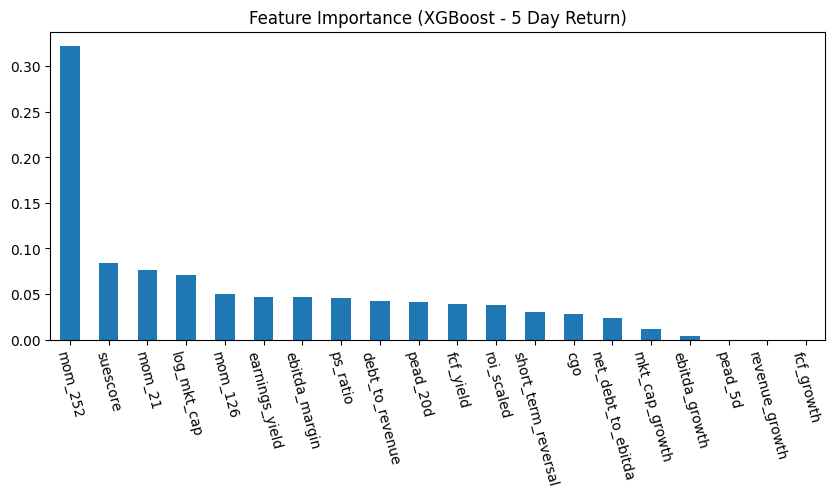

Top 10 Important Features: ['mom_252', 'suescore', 'mom_21', 'log_mkt_cap', 'mom_126', 'earnings_yield', 'ebitda_margin', 'ps_ratio', 'debt_to_revenue', 'pead_20d']


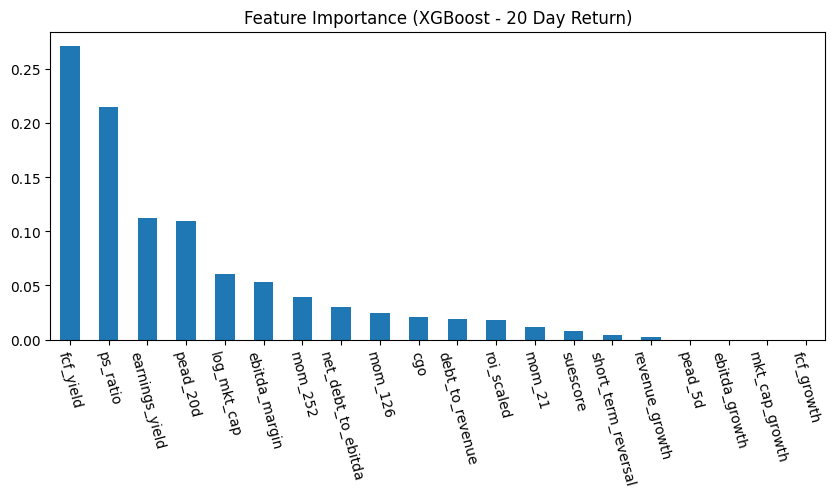

Top 10 Important Features: ['fcf_yield', 'ps_ratio', 'earnings_yield', 'pead_20d', 'log_mkt_cap', 'ebitda_margin', 'mom_252', 'net_debt_to_ebitda', 'mom_126', 'cgo']


ValueError: With n_samples=0, test_size=0.2 and train_size=None, the resulting train set will be empty. Adjust any of the aforementioned parameters.

In [106]:
prediction_target_windows = [5, 20, 60]
feature_importance_dict = {}

ml_data = final_df.copy()

for w in prediction_target_windows:
    prediction_target_window = w

    ml_data['target_return'] = ml_data.groupby('ticker')['adj_close'].pct_change(prediction_target_window).shift(-prediction_target_window)

    ml_data.dropna(subset=['target_return'], inplace=True)

    ml_data = ml_data.dropna(subset=features + ['target_return'])

    X = ml_data[features]
    y = ml_data['target_return']

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
    xgb_model.fit(X_train_scaled, y_train)

    feature_importance = pd.Series(xgb_model.feature_importances_, index=features).sort_values(ascending=False)

    feature_importance_dict[w] = feature_importance

    plt.figure(figsize=(10, 4))
    feature_importance.plot(kind='bar')
    plt.xticks(rotation=-75) 
    plt.title(f"Feature Importance (XGBoost - {w} Day Return)")
    plt.show()

    top_features = feature_importance.index[:10].tolist()
    print("Top 10 Important Features:", top_features)

#### SC model

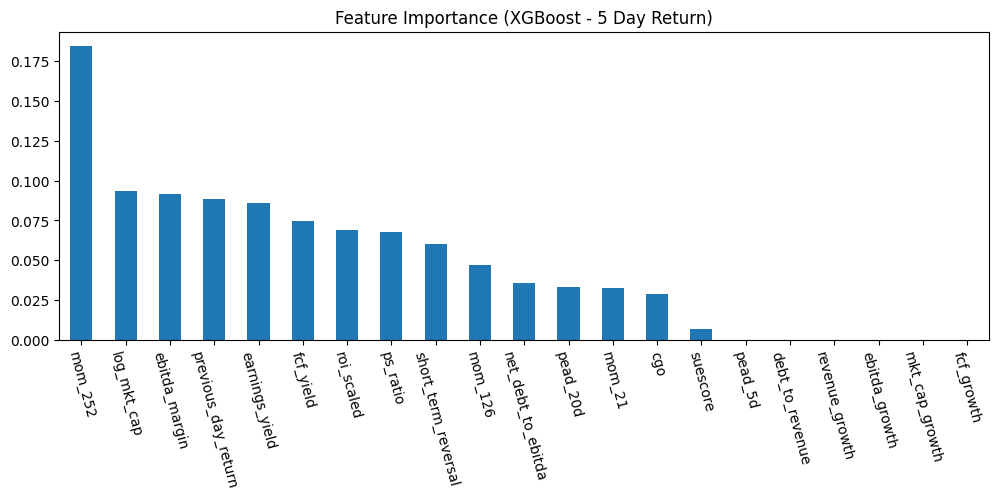

Top 10 Important Features: ['mom_252', 'log_mkt_cap', 'ebitda_margin', 'previous_day_return', 'earnings_yield', 'fcf_yield', 'roi_scaled', 'ps_ratio', 'short_term_reversal', 'mom_126']


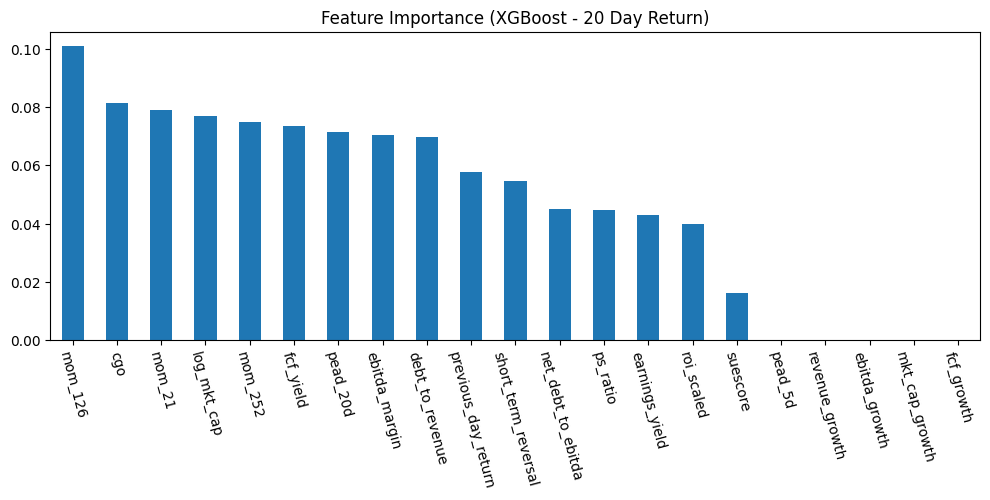

Top 10 Important Features: ['mom_126', 'cgo', 'mom_21', 'log_mkt_cap', 'mom_252', 'fcf_yield', 'pead_20d', 'ebitda_margin', 'debt_to_revenue', 'previous_day_return']


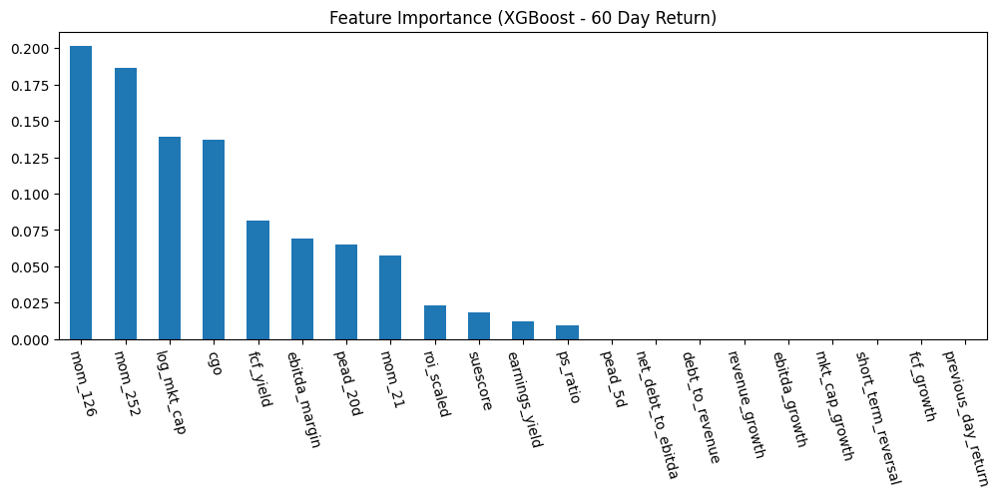

Top 10 Important Features: ['mom_126', 'mom_252', 'log_mkt_cap', 'cgo', 'fcf_yield', 'ebitda_margin', 'pead_20d', 'mom_21', 'roi_scaled', 'suescore']


In [107]:
validation_set = final_df.loc[final_df['date']>=pd.to_datetime('2024-01-01')].copy()
in_sample = final_df.loc[final_df['date']<pd.to_datetime('2024-01-01')].copy()
test_size = int(np.floor(len(in_sample) * 0.1))
test_set = in_sample.iloc[-test_size:]
training_set = in_sample.iloc[:-test_size]

req_cols = [
    'ticker',
    'date',
    'adj_close'
]
features = [
    'suescore',
    'cgo', 
    'mom_21', 'mom_126', 'mom_252','short_term_reversal', 
    'pead_5d', 'pead_20d', 
    'ps_ratio','earnings_yield', 'fcf_yield', 'ebitda_margin', 'roi_scaled',
    'net_debt_to_ebitda', 'debt_to_revenue', 'revenue_growth',
    'ebitda_growth', 'mkt_cap_growth', 'log_mkt_cap', 'fcf_growth', 'previous_day_return'
]
for w in prediction_target_windows:   
    
    test_size = int(np.floor(len(in_sample) * 0.1))
    X_train = training_set[features]
    y_train = training_set[f'target_return_{w}_day']
    X_test = test_set[features]
    y_test = test_set[f'target_return_{w}_day']
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    xgb_model = xgb.XGBRegressor(n_estimators=10, learning_rate=0.1, max_depth=5, random_state=42)
    xgb_model.fit(X_train_scaled, y_train)

    feature_importance = pd.Series(xgb_model.feature_importances_, index=features).sort_values(ascending=False)

    feature_importance_dict[w] = feature_importance

    plt.figure(figsize=(12, 4))
    feature_importance.plot(kind='bar')
    plt.xticks(rotation=-75) 
    plt.title(f"Feature Importance (XGBoost - {w} Day Return)")
    plt.show()

    top_features = feature_importance.index[:10].tolist()
    print("Top 10 Important Features:", top_features)


## Data Analysis

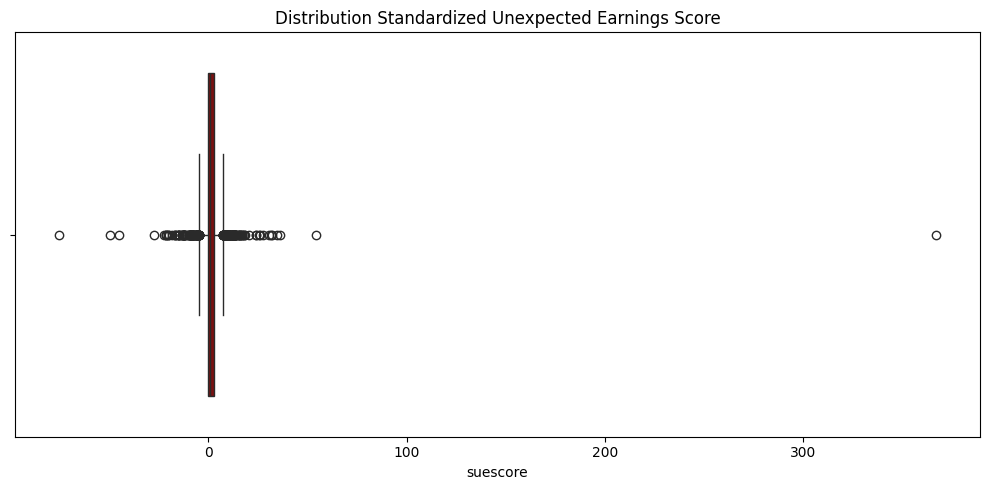

In [108]:
fig, ax = plt.subplots(figsize=(10,5))
sns.boxplot(data=training_set['suescore'], orient='h', color='darkred')
ax.set_title('Distribution Standardized Unexpected Earnings Score')
plt.tight_layout()
plt.show()

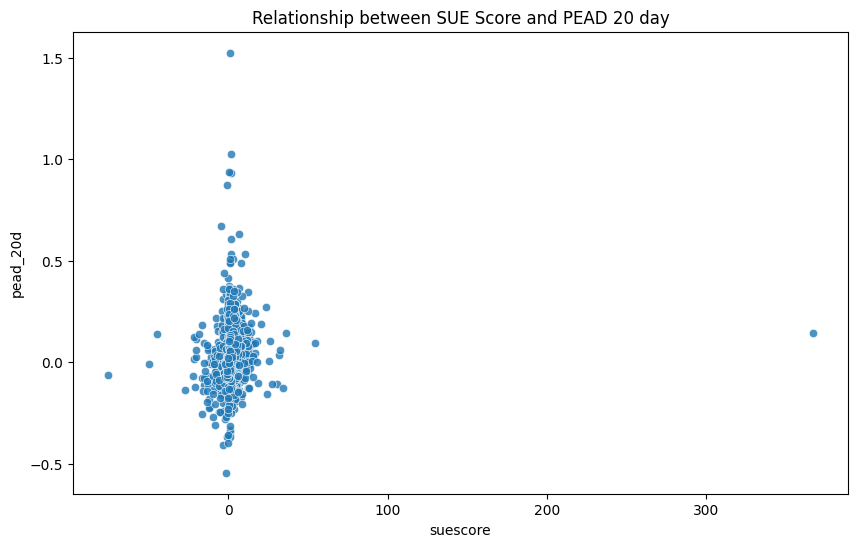

In [109]:
plt.figure(figsize=(10, 6))

plot_df = training_set.copy()

sns.scatterplot(
    x='suescore', 
    y='pead_20d', 
    data=plot_df, 
    palette='tab10',
    alpha=0.8  
)

plt.xlabel('suescore')
plt.ylabel('pead_20d')
plt.title('Relationship between SUE Score and PEAD 20 day')

plt.show()

sue_quantile
Low    -0.003654
Q2      0.024838
Q3      0.034877
Q4      0.039886
High    0.061008
Name: pead_20d, dtype: float64


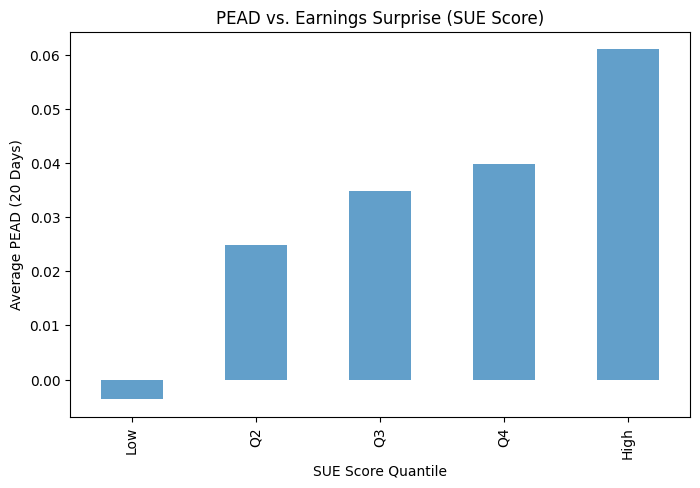

In [110]:
training_set['sue_quantile'] = pd.qcut(training_set['suescore'], q=5, labels=['Low', 'Q2', 'Q3', 'Q4', 'High'])

sue_pead_summary = training_set.groupby('sue_quantile')['pead_20d'].mean()
print(sue_pead_summary)

plt.figure(figsize=(8,5))
sue_pead_summary.plot(kind='bar',alpha=0.7)
plt.xlabel("SUE Score Quantile")
plt.ylabel("Average PEAD (20 Days)")
plt.title("PEAD vs. Earnings Surprise (SUE Score)")
plt.show()

## Strategy Implementation & Performance Analysis

In [111]:
spy_benchmark = spy_eod_data.loc[spy_eod_data['date'].between(data_start_date, data_end_date)].copy().reset_index(drop=True)
spy_benchmark['spy_return'] = spy_benchmark['adj_close'].pct_change()
spy_benchmark['date'] = pd.to_datetime(spy_benchmark['date'])

# spy_benchmark.to_pickle('../data/spy_benchmark.pkl')
# spy_benchmark = pd.read_pickle('../data/spy_benchmark.pkl')

In [112]:
trading_data = merged_df.loc[(merged_df['date']>=data_start_date) & (merged_df['date']<=data_end_date)].copy().reset_index(drop=True).sort_values(by=['date'])
# trading_data.to_pickle('../data/trading_data.pkl')
# trading_data = pd.read_pickle('../data/trading_data.pkl')

In [113]:
class QTS:
    def __init__(
            self, 
            data,
            benchmark_data,
            rank_features=['suescore'],
            quantile_n=5,
            holding_period=20, 
            dynamic_sizing='equal',
            stop_loss_threshold=-0.05,
            initial_funding_rate=0.043, 
            repo_spread=0.01, 
            initial_capital=1_000_000
        ):
        """
        PEAD-Based Quant Trading Strategy with Full Price Data.
        """
        self.data = data.sort_values(['date', 'ticker']).copy().reset_index(drop=True)
        self.benchmark = benchmark_data.sort_values('date').copy().reset_index(drop=True)
        self.rank_metrics = rank_features
        self.quantile_n = quantile_n
        self.holding_period = holding_period
        self.dynamic_sizing = dynamic_sizing
        self.stop_loss_threshold = stop_loss_threshold
        self.funding_rate = initial_funding_rate
        self.repo_rate = self.funding_rate - repo_spread  
        self.initial_capital = initial_capital
        self.current_capital = initial_capital
        self.pnl_data = None
        self.trade_log = []
        self.strategy_name = f"{self.holding_period}day_holding-{self.dynamic_sizing}_size-{self.quantile_n}_qtl"

    def _calculate_quantiles(self):
        """ Assign quantiles to stocks only on earnings days while keeping full price data. """

        for metric in self.rank_metrics:
            if metric not in self.data.columns:
                raise ValueError(f"Rank metric '{metric}' not found in data.")
        
        self.data['long_signal'] = False
        self.data['short_signal'] = False

        rank_df = self.data[self.rank_metrics].apply(lambda x: (x - x.mean()) / x.std(), axis=0).copy()
        self.data['rank_metric'] = rank_df.mean(axis=1)

        earnings_days = self.data[self.data['day_after_earnings'] == self.data['date']]['date'].unique()
        for date in earnings_days:
            subset = self.data[(self.data['date'] == date) & (self.data['day_after_earnings']==date)].copy()
            # Assign quantiles only for stocks reporting earnings
            subset['quantile'] = pd.qcut(subset['rank_metric'], self.quantile_n, labels=False, duplicates='drop')

            # Define Long and Short signals
            subset['long_signal'] = subset['quantile'] == subset['quantile'].max()
            # subset['short_signal'] = subset['quantile'] == subset['quantile'].min()

            # Merge updated signals into full dataset
            self.data.loc[self.data['date'] == date, ['long_signal', 'short_signal']] = subset[['long_signal', 'short_signal']]
            self.data[['long_signal', 'short_signal']] = self.data[['long_signal', 'short_signal']].fillna(False)

        self.data = self._calculate_positions(self.data)

    def _calculate_positions(self, subset_df):
        """ Assign position sizes based on quantile ranks for each earnings date separately. """

        positions_df = subset_df.copy()
        positions_df['position_size'] = 0

        # Get unique earnings announcement days
        earnings_days = positions_df['day_after_earnings'].unique()

        for date in earnings_days:
            # Select only stocks that had earnings on this date
            daily_subset = positions_df[positions_df['date'] == date].copy()

            if daily_subset.empty:
                continue

            # Apply position sizing only within stocks that reported earnings on this date
            if self.dynamic_sizing == 'equal':
                daily_subset['position_size'] = np.select(
                    [daily_subset['long_signal'], daily_subset['short_signal']],
                    [1, -1], default=0
                )

                total_symbols = daily_subset['long_signal'].sum() + daily_subset['short_signal'].sum()
                if total_symbols > 0:
                    daily_subset['position_size'] /= total_symbols  # Normalize across earnings day stocks

            elif self.dynamic_sizing == 'dynamic':
                num_long = daily_subset['long_signal'].sum()
                num_short = daily_subset['short_signal'].sum()

                if num_long > 1:
                    daily_subset.loc[daily_subset['long_signal'], 'position_size'] = daily_subset.loc[daily_subset['long_signal'], 'rank_metric'].rank(method='dense', ascending=False)

                if num_short > 1:
                    daily_subset.loc[daily_subset['short_signal'], 'position_size'] = -daily_subset.loc[daily_subset['short_signal'], 'rank_metric'].rank(method='dense', ascending=True)

                # Normalize position sizes within the earnings day
                max_pos = daily_subset['position_size'].abs().max()
                if max_pos > 0:
                    daily_subset['position_size'] /= max_pos  # Scale between -1 and 1

            # Merge updated positions back into the main dataset
            positions_df.loc[positions_df['date'] == date, 'position_size'] = daily_subset['position_size']*0.05

        return positions_df

    def _track_trades(self):
        """ Track entry and exit details for each trade, looping through daily price data to check stop-loss. """

        trading_days = sorted(self.data['date'].unique())
        trade_entries = self.data[self.data['long_signal'] | self.data['short_signal']].copy()

        # Initialize exit date as the planned holding period exit
        trade_entries['exit_date'] = trade_entries['date'].apply(
            lambda x: next((d for d in trading_days if d > x and (d - x).days >= self.holding_period), np.nan)
        )

        # Merge with exit prices
        exit_prices = self.data[['date', 'ticker', 'adj_close']].rename(columns={'date': 'exit_date', 'adj_close': 'exit_price'})
        trade_entries = trade_entries.merge(exit_prices, on=['exit_date', 'ticker'], how='left')

        trade_entries['trade_type'] = np.where(trade_entries['long_signal'], 'Long', 'Short')
        trade_entries = trade_entries.rename(columns={'date': 'entry_date', 'adj_close': 'entry_price'})
        trade_entries['notional'] = trade_entries['position_size'] * self.initial_capital

        # --- Apply Stop-Loss on a Daily Basis ---
        stop_loss_dates = []  # Store new exit dates for trades that hit stop-loss

        for index, row in trade_entries.iterrows():
            entry_date = row['entry_date']
            exit_date = row['exit_date']
            ticker = row['ticker']
            entry_price = row['entry_price']
            trade_type = row['trade_type']

            # Get price data for this ticker after entry date
            price_data = self.data[(self.data['ticker'] == ticker) & (self.data['date'] > entry_date) & (self.data['date']<=exit_date)].copy()

            for i, price_row in price_data.iterrows():
                current_date = price_row['date']
                current_price = price_row['adj_close']
                return_pct = (current_price / entry_price - 1) if trade_type == 'Long' else (entry_price / current_price - 1)

                # If stop-loss is hit, exit immediately
                if return_pct < self.stop_loss_threshold:
                    stop_loss_dates.append({'ticker': ticker, 'entry_date': entry_date, 'exit_date': current_date,'exit_price': current_price})
                    break  # Stop checking further dates once stop-loss is hit
            
            if stop_loss_dates is None:
                stop_loss_dates.append({'ticker': ticker, 'entry_date': entry_date, 'exit_date': exit_date, 'exit_price': row['exit_price']})

        # Convert stop-loss exits to DataFrame and merge with trade entries
        stop_loss_df = pd.DataFrame(stop_loss_dates)
        trade_entries = trade_entries.merge(stop_loss_df, on=['ticker','entry_date'], how='left')

        # Replace exit_date with stop-loss exit if applicable
        trade_entries['exit_date'] = trade_entries['exit_date_y'].combine_first(trade_entries['exit_date_x'])
        trade_entries['exit_price'] = trade_entries['exit_price_y'].combine_first(trade_entries['exit_price_x'])
        trade_entries.drop(columns=['exit_date_x', 'exit_date_y'], inplace=True)
        trade_entries.drop(columns=['exit_price_x', 'exit_price_y'], inplace=True)
        
        trade_entries['return'] = np.where(
            trade_entries['trade_type'] == 'Long',
            (trade_entries['exit_price'] - trade_entries['entry_price']) / trade_entries['entry_price'],
            (trade_entries['entry_price'] - trade_entries['exit_price']) / trade_entries['entry_price']
        )

        # Store updated trade log
        self.trade_log = trade_entries[['ticker', 'entry_date', 'entry_price', 'exit_date', 
                                        'exit_price', 'trade_type', 'position_size', 'notional','return']].to_dict('records')

    def _calculate_accounting(self):
        """ Compute detailed PnL metrics using trade logs, including repo costs and cumulative returns. """
    
        trade_df = pd.DataFrame(self.trade_log)

        if trade_df.empty:
            print("Error: No trades recorded. Check signal generation.")
            return

        # Compute trade returns and PnL
        trade_df['trade_return'] = np.where(
            trade_df['trade_type'] == 'Long',
            (trade_df['exit_price'] - trade_df['entry_price']) / trade_df['entry_price'],
            (trade_df['entry_price'] - trade_df['exit_price']) / trade_df['entry_price']
        )

        # Compute PnL per trade
        trade_df['pnl'] = trade_df['trade_return'] * abs(trade_df['notional'])

        # Calculate repo cost (for short positions)
        trade_df['repo_cost'] = -self.repo_rate / 252 * trade_df['position_size'].clip(upper=0) * trade_df['entry_price']

        # Compute net PnL (including repo cost)
        trade_df['net_pnl'] = trade_df['pnl'] + trade_df['repo_cost']

        # Compute net return based on initial capital
        trade_df['net_ret'] = trade_df['net_pnl'] / self.initial_capital

        # Aggregate cumulative PnL over time
        self.pnl_data = trade_df.groupby('exit_date')[['pnl', 'repo_cost', 'net_pnl', 'net_ret']].sum().reset_index()
        self.pnl_data['cumulative_pnl'] = self.pnl_data['net_pnl'].cumsum()
        self.pnl_data['cumulative_ret'] = self.pnl_data['net_ret'].cumsum()
        self.pnl_data.rename(columns={'exit_date':'date'}, inplace=True)

    def backtest(self):
        """ Run backtest while preserving full price data. """
        print(f"Starting Backtest for {self.strategy_name}...")
        self._calculate_quantiles()
        self._track_trades()
        self._calculate_accounting()
        self.performance_metrics()

    def get_trade_log(self):
        """ Display trade history. """
        trade_df = pd.DataFrame(self.trade_log)
        return trade_df

    def plot_pnl(self):
        """ Plot cumulative PnL over time. """
        plt.figure(figsize=(12, 4))
        plt.plot(self.pnl_data['date'], self.pnl_data['cumulative_pnl'], label='Cumulative Net PnL')
        plt.title(f"Strategy Cumulative Daily PnL Over Time")
        plt.xlabel("Date")
        plt.ylabel("PnL ($)")
        plt.legend()
        plt.gca().yaxis.set_major_formatter(mticker.FuncFormatter(thousands_formatter))
        plt.grid(axis='y', linestyle='-', alpha=0.7)  
        plt.grid(axis='x', linestyle='-', alpha=0.7)  
        plt.show()

    def performance_metrics(self, annualization_factor=252):
        """ Compute strategy performance metrics. """
        daily_returns = self.pnl_data.groupby('date')['net_ret'].sum().reset_index()['net_ret']
        merged_df = self.pnl_data.merge(self.benchmark[['date', 'adj_close']], on='date', how='left', suffixes=('', '_benchmark'))
        merged_df['benchmark_ret'] = merged_df['adj_close'].pct_change()
        merged_df['excess_ret'] = merged_df['net_ret'] - merged_df['benchmark_ret']

        self.perf_metrics =  pd.DataFrame({'Mean': [daily_returns.mean() * annualization_factor]})
        self.perf_metrics['Volatility'] = daily_returns.std() * np.sqrt(annualization_factor)
        self.perf_metrics['Sharpe Ratio'] = (daily_returns.mean()) / daily_returns.std() * np.sqrt(annualization_factor)
        
        mean_excess_ret = merged_df['excess_ret'].mean() * annualization_factor
        std_excess_ret = merged_df['excess_ret'].std() * np.sqrt(annualization_factor)
        information_ratio = mean_excess_ret / std_excess_ret if std_excess_ret != 0 else np.nan
        self.perf_metrics['Information Ratio'] = information_ratio

        X = sm.add_constant(merged_df['benchmark_ret']) 
        Y = merged_df['net_ret']
        
        model = sm.OLS(Y, X, missing='drop').fit() 
        beta = model.params[1] 
        alpha = model.params[0] * annualization_factor 

        self.perf_metrics['Beta'] = beta
        self.perf_metrics['Alpha'] = alpha
        self.perf_metrics['Skewness'] = daily_returns.skew()
        self.perf_metrics['Kurtosis'] = daily_returns.kurtosis()
        self.perf_metrics['Var (0.05)'] = daily_returns.quantile(0.05)
        self.perf_metrics['CVaR (0.05)'] = daily_returns[daily_returns <= daily_returns.quantile(0.05)].mean()

        wealth_index = 1000 * (1 + daily_returns).cumprod()
        previous_peaks = wealth_index.cummax()
        drawdowns = (wealth_index - previous_peaks) / previous_peaks
        self.perf_metrics['Max Drawdown'] = drawdowns.min()
        
        self.perf_metrics.rename(index={0: self.strategy_name}, inplace=True)
        self.perf_metrics = self.perf_metrics.round(4)

Starting Backtest for 5day_holding-equal_size-5_qtl...


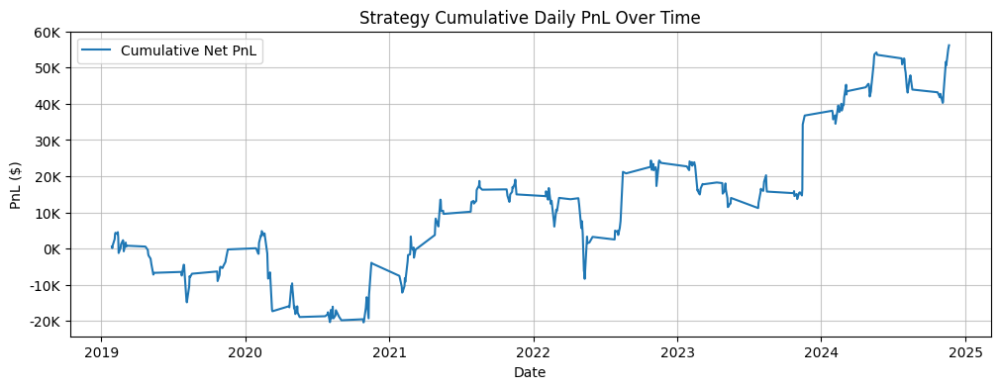

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
5day_holding-equal_size-5_qtl,0.0421,0.0404,1.0418,-1.991,0.033,0.0172,1.0019,9.9463,-0.0033,-0.0055,-0.0272


Starting Backtest for 5day_holding-equal_size-8_qtl...


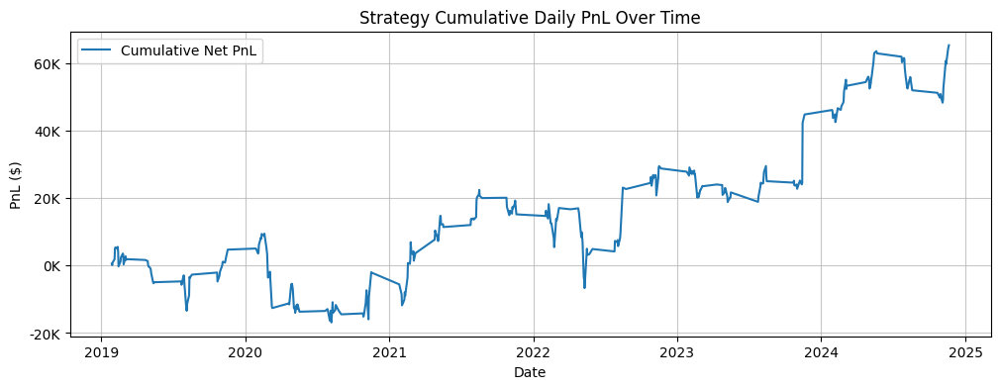

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
5day_holding-equal_size-8_qtl,0.0502,0.043,1.1666,-1.9952,0.0338,0.024,0.8479,8.044,-0.0034,-0.0058,-0.0289


Starting Backtest for 5day_holding-equal_size-10_qtl...


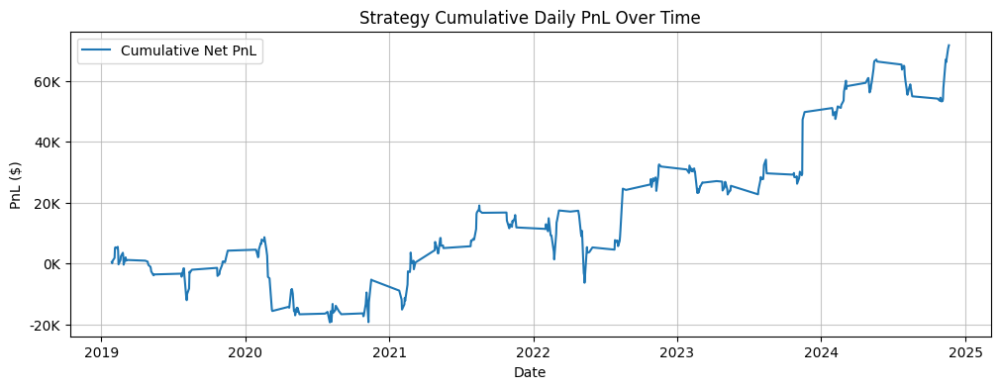

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
5day_holding-equal_size-10_qtl,0.0554,0.0438,1.2638,-2.0268,0.0329,0.0299,0.6371,8.0904,-0.0034,-0.0059,-0.0277


Starting Backtest for 5day_holding-equal_size-15_qtl...


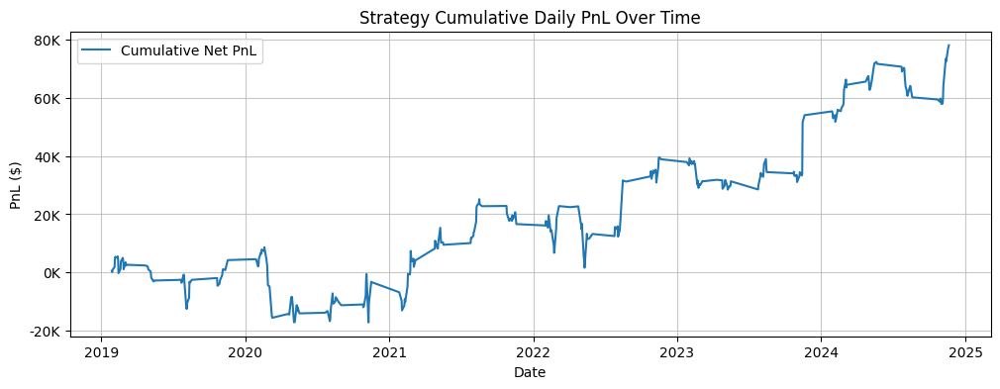

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
5day_holding-equal_size-15_qtl,0.0613,0.0467,1.3129,-2.0196,0.0358,0.0331,0.1417,8.7067,-0.0034,-0.0062,-0.0258


Starting Backtest for 20day_holding-equal_size-5_qtl...


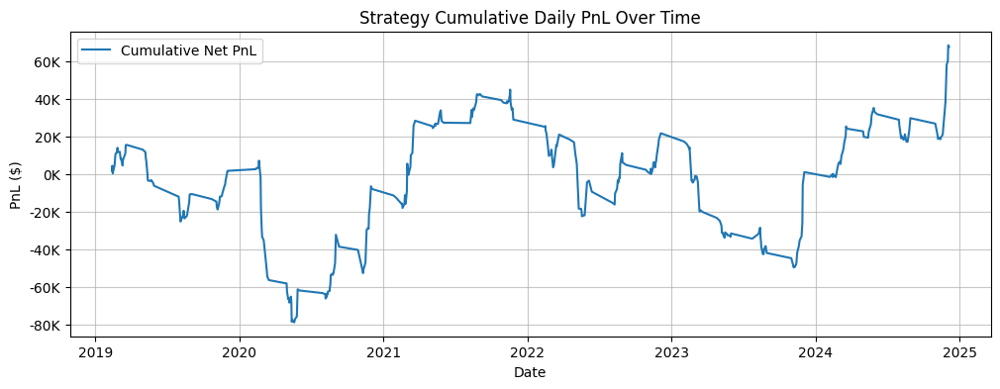

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
20day_holding-equal_size-5_qtl,0.043,0.0629,0.684,-1.6001,0.0193,0.0297,0.0725,5.3556,-0.0056,-0.0094,-0.0911


Starting Backtest for 20day_holding-equal_size-8_qtl...


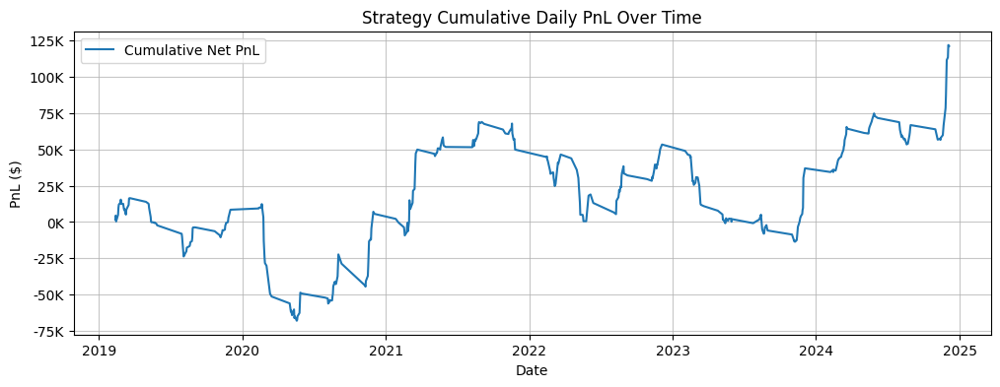

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
20day_holding-equal_size-8_qtl,0.0826,0.0718,1.151,-1.6159,0.0184,0.0691,0.6017,5.5786,-0.0059,-0.0097,-0.0814


Starting Backtest for 20day_holding-equal_size-10_qtl...


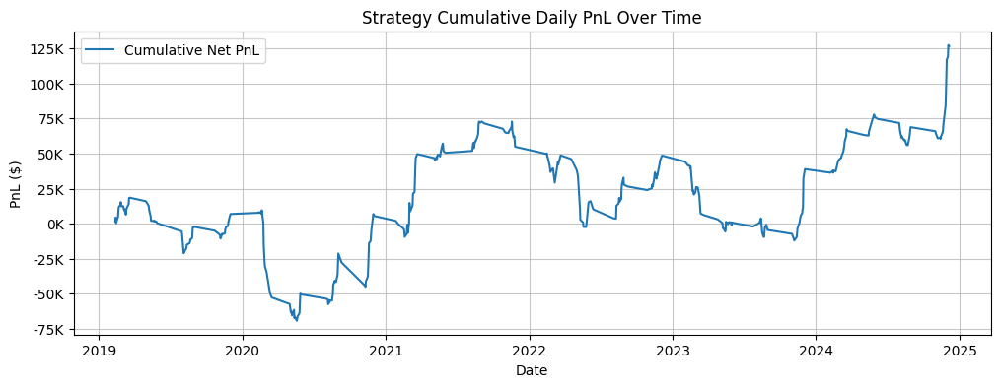

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
20day_holding-equal_size-10_qtl,0.0887,0.0741,1.197,-1.6232,0.021,0.073,0.4478,5.3387,-0.0059,-0.0102,-0.0846


Starting Backtest for 20day_holding-equal_size-15_qtl...


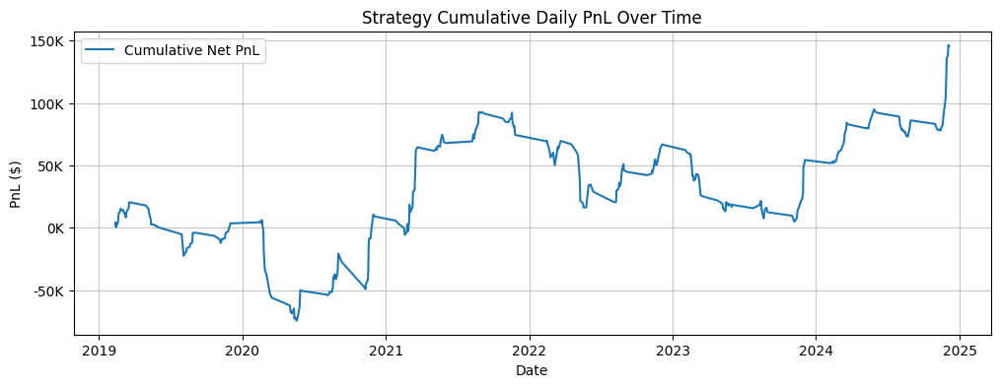

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
20day_holding-equal_size-15_qtl,0.1046,0.0793,1.3199,-1.5982,0.0177,0.091,0.3746,5.0768,-0.0063,-0.0109,-0.0912


Starting Backtest for 60day_holding-equal_size-5_qtl...


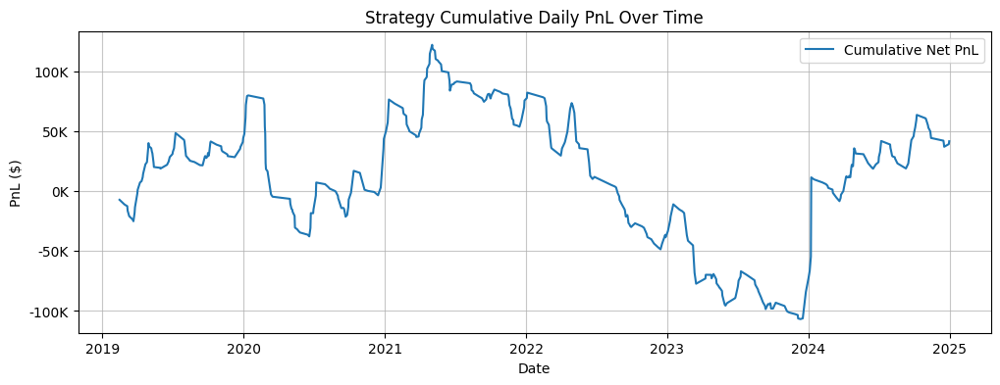

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
60day_holding-equal_size-5_qtl,0.0266,0.1051,0.2528,-1.5691,0.0365,0.0087,3.0651,27.1924,-0.0071,-0.0118,-0.2063


Starting Backtest for 60day_holding-equal_size-8_qtl...


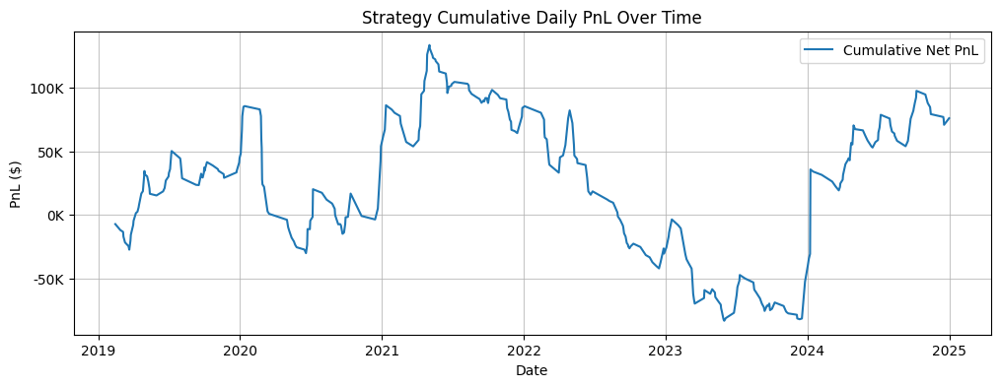

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
60day_holding-equal_size-8_qtl,0.0546,0.1177,0.4641,-1.6716,0.0394,0.0328,2.7575,20.3048,-0.0072,-0.0124,-0.196


Starting Backtest for 60day_holding-equal_size-10_qtl...


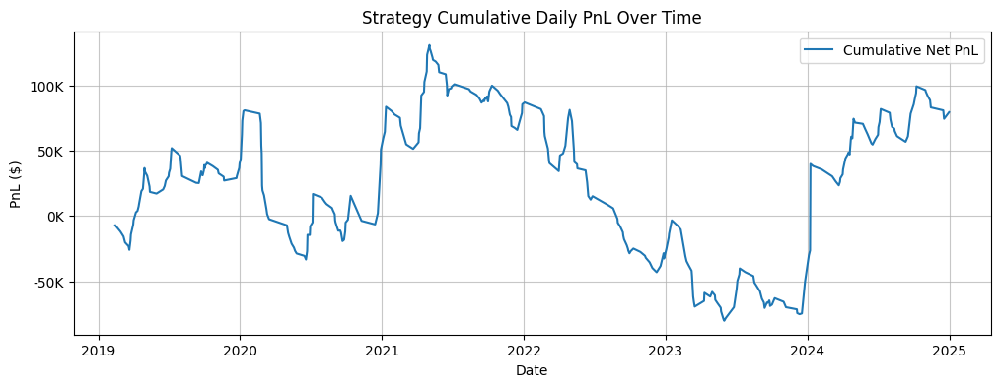

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
60day_holding-equal_size-10_qtl,0.0598,0.1208,0.4951,-1.6784,0.0361,0.0393,2.5726,18.7697,-0.0074,-0.0132,-0.1919


Starting Backtest for 60day_holding-equal_size-15_qtl...


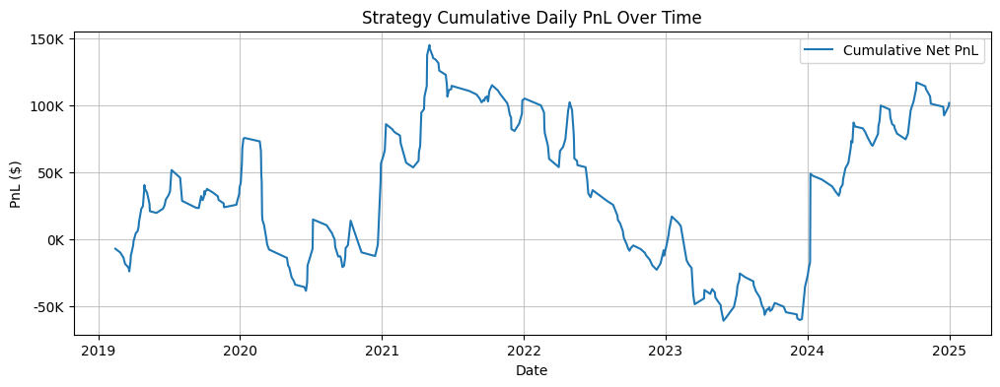

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
60day_holding-equal_size-15_qtl,0.08,0.1281,0.6248,-1.6682,0.0343,0.06,2.4913,17.2235,-0.0084,-0.0142,-0.1877


Starting Backtest for 90day_holding-equal_size-5_qtl...


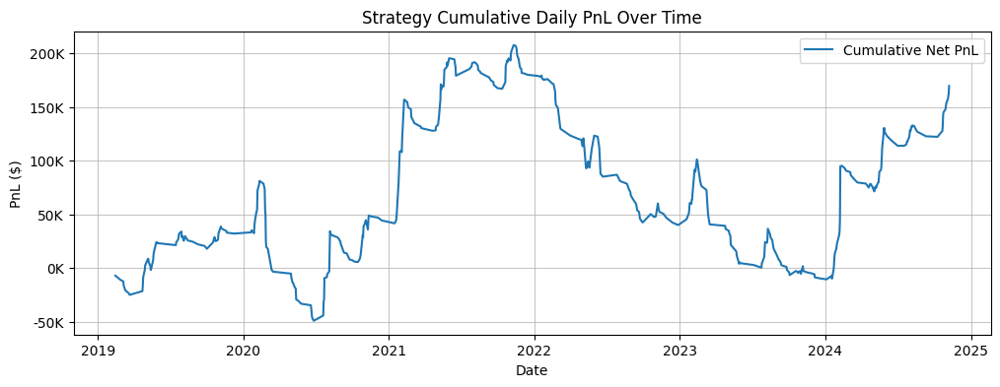

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
90day_holding-equal_size-5_qtl,0.0996,0.1013,0.9839,-1.3184,0.0433,0.079,1.7646,12.2945,-0.0069,-0.0117,-0.198


Starting Backtest for 90day_holding-equal_size-8_qtl...


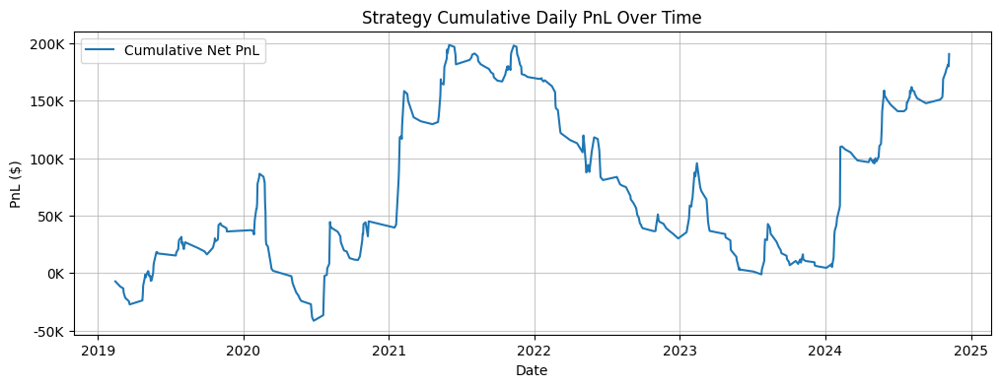

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
90day_holding-equal_size-8_qtl,0.1288,0.1137,1.1327,-1.3891,0.0418,0.1062,1.7199,9.649,-0.0072,-0.0125,-0.183


Starting Backtest for 90day_holding-equal_size-10_qtl...


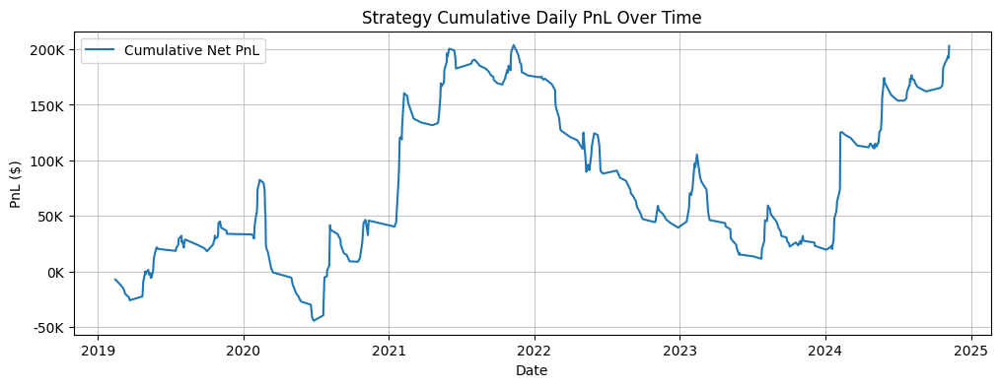

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
90day_holding-equal_size-10_qtl,0.1445,0.1181,1.2236,-1.3802,0.0373,0.1238,1.5712,8.5138,-0.008,-0.0132,-0.1769


Starting Backtest for 90day_holding-equal_size-15_qtl...


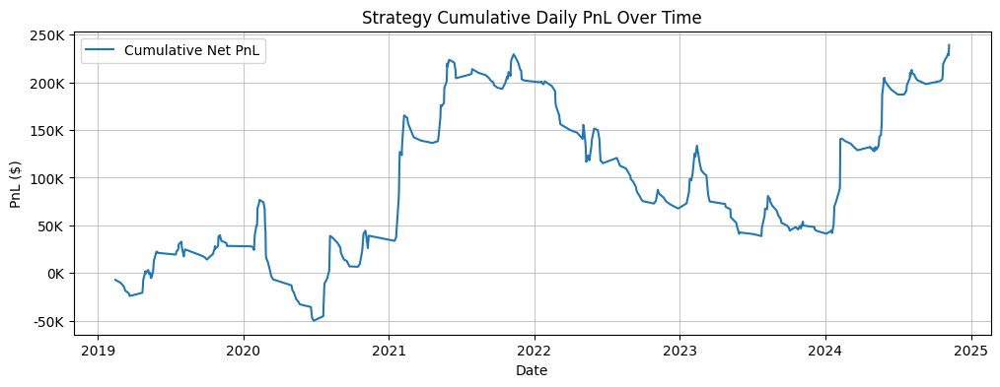

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
90day_holding-equal_size-15_qtl,0.1783,0.1265,1.4091,-1.3384,0.0339,0.1592,1.507,6.9521,-0.0084,-0.014,-0.1756


Starting Backtest for 120day_holding-equal_size-5_qtl...


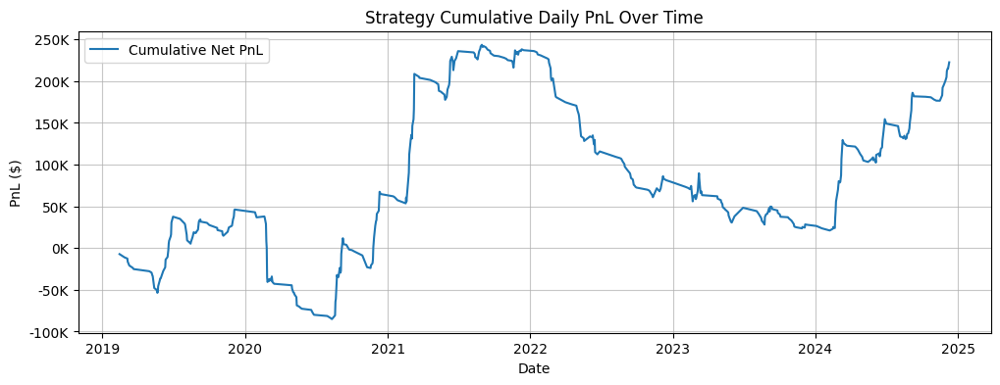

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
120day_holding-equal_size-5_qtl,0.132,0.1068,1.2365,-1.208,0.0176,0.1261,1.0558,7.0308,-0.0067,-0.0121,-0.2011


Starting Backtest for 120day_holding-equal_size-8_qtl...


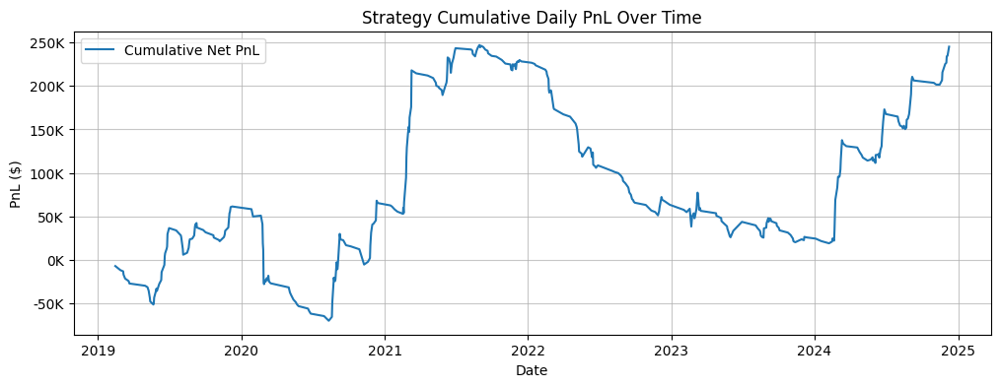

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
120day_holding-equal_size-8_qtl,0.1648,0.1206,1.3661,-1.269,0.0179,0.1581,1.06,6.0849,-0.0072,-0.0132,-0.2056


Starting Backtest for 120day_holding-equal_size-10_qtl...


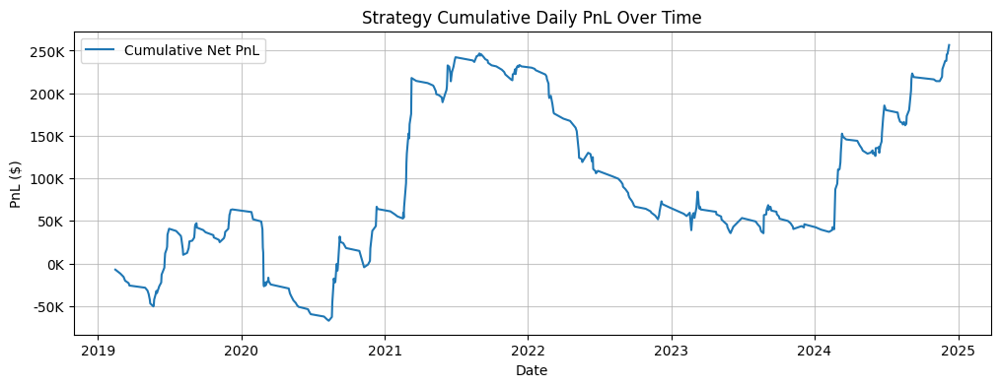

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
120day_holding-equal_size-10_qtl,0.1827,0.1263,1.4467,-1.2774,0.0147,0.1779,0.9644,5.2274,-0.0076,-0.0141,-0.192


Starting Backtest for 120day_holding-equal_size-15_qtl...


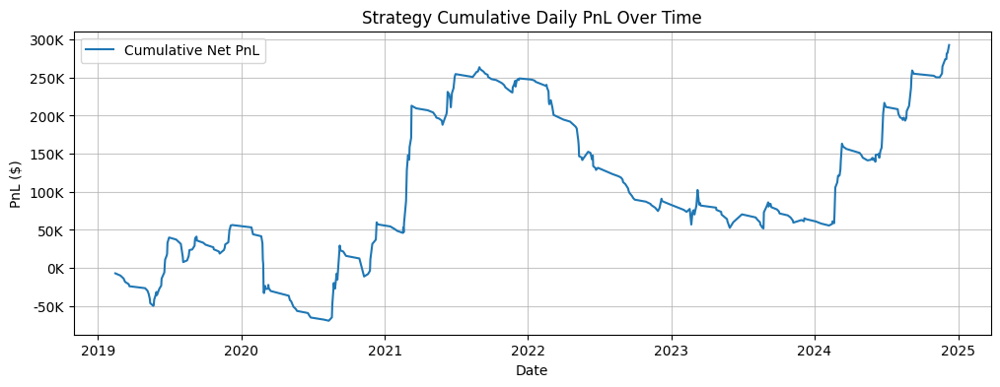

,Mean,Volatility,Sharpe Ratio,Information Ratio,Beta,Alpha,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
120day_holding-equal_size-15_qtl,0.2202,0.1352,1.6288,-1.2451,0.0146,0.2152,0.9968,4.6157,-0.0083,-0.015,-0.1925


In [114]:
test_date = '2024-12-31'

holding_periods = [5, 20, 60, 90, 120]
quantiles = [5, 8, 10, 15]

bts_list = {}

for n in holding_periods:
    for q in quantiles:
        key = f"{n}D_{q}Q"
        strategy_backtest = QTS(
            data=trading_data.loc[trading_data.date<=test_date].sort_values(by=['date']).reset_index(drop=True), 
            benchmark_data=spy_benchmark.loc[spy_benchmark.date<=test_date].sort_values(by=['date']).reset_index(drop=True),
            rank_features=['mom_126', 'mom_252', 'log_mkt_cap', 'cgo', 'fcf_yield', 'ebitda_margin', 'pead_20d', 'mom_21', 'roi_scaled', 'suescore'],
            quantile_n=q,  
            holding_period=n, 
            dynamic_sizing='equal',
            stop_loss_threshold=-0.05,
        )
        strategy_backtest.backtest()
        bts_list[key] = strategy_backtest
        strategy_backtest.plot_pnl()
        display(strategy_backtest.perf_metrics)

In [ ]:
trade_log_df = bts_list[16].get_trade_log().dropna()
display(trade_log_df.head())
display(trade_log_df.tail())

KeyError: 10

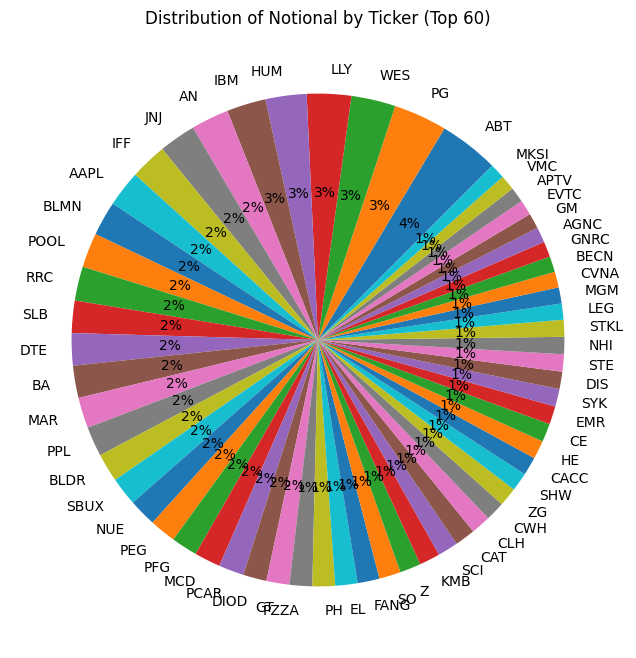

In [ ]:
plot_df = trade_log_df.copy()
total_notional = plot_df['notional'].sum()
plot_df = (plot_df.groupby(['ticker'])['notional'].sum()/total_notional).reset_index().sort_values('notional', ascending=False).head(60)
plt.figure(figsize=(10, 8))
plt.pie(
    plot_df['notional'], 
    labels=plot_df['ticker'], 
    autopct='%1.0f%%',
    startangle=45,    
    textprops={'fontsize': 10}
)

plt.title("Distribution of Notional by Ticker (Top 60)")

plt.show()

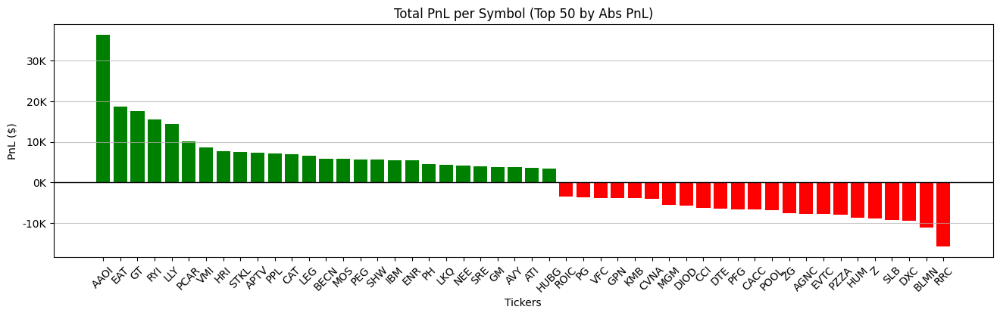

In [ ]:
trade_log_df['pnl'] = trade_log_df['notional'] * trade_log_df['return']
plot_df = trade_log_df.copy()
plot_df = plot_df.groupby(['ticker'])['pnl'].sum().reset_index().sort_values('pnl', ascending=False).reset_index(drop=True)
plot_df = plot_df.loc[plot_df['pnl'].abs().nlargest(50).index].sort_values(by='pnl', ascending=False)

colors = plot_df['pnl'].apply(lambda x: 'green' if x > 0 else 'red')

plt.figure(figsize=(16, 4))
plt.bar(plot_df['ticker'], plot_df['pnl'], color=colors)

plt.xlabel('Tickers')
plt.ylabel('PnL ($)')
plt.title('Total PnL per Symbol (Top 50 by Abs PnL)')
plt.xticks(rotation=45)

plt.axhline(0, color='black', linewidth=1)

plt.grid(axis='y', linestyle='-', alpha=0.7)
plt.gca().yaxis.set_major_formatter(mticker.FuncFormatter(thousands_formatter))
plt.show()

In [ ]:
pnl_df = bts_list[20].pnl_data.copy()

display(pnl_df.head())
display(pnl_df.tail())

,date,pnl,repo_cost,net_pnl,net_ret,cumulative_pnl,cumulative_ret
0,2019-02-12,1792.351848,0.0,1792.351848,0.001792,1792.351848,0.001792
1,2019-02-13,2619.300106,0.0,2619.300106,0.002619,4411.651954,0.004412
2,2019-02-14,-4085.629598,0.0,-4085.629598,-0.004086,326.022356,0.000326
3,2019-02-19,4726.905611,0.0,4726.905611,0.004727,5052.927966,0.005053
4,2019-02-20,3402.911727,0.0,3402.911727,0.003403,8455.839693,0.008456


,date,pnl,repo_cost,net_pnl,net_ret,cumulative_pnl,cumulative_ret
392,2024-11-27,6321.038470,0.0,6321.038470,0.006321,45792.923340,0.045793
393,2024-11-29,13510.014639,0.0,13510.014639,0.013510,59302.937978,0.059303
394,2024-12-02,1905.717151,0.0,1905.717151,0.001906,61208.655130,0.061209
395,2024-12-03,8471.092149,0.0,8471.092149,0.008471,69679.747279,0.069680
396,2024-12-05,-755.470650,0.0,-755.470650,-0.000755,68924.276629,0.068924


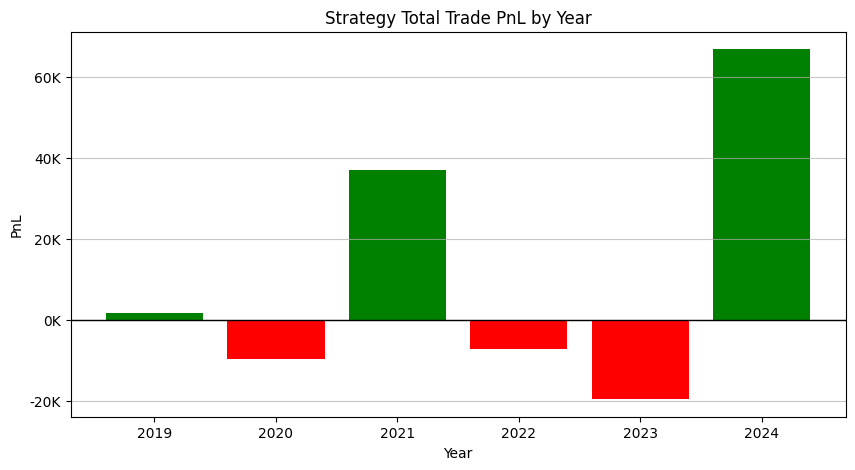

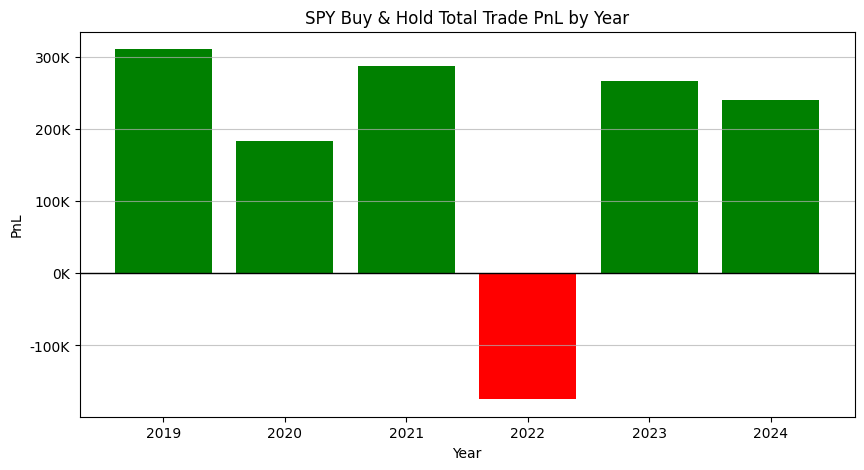

In [ ]:
df = pnl_df.copy()
df['year'] = pd.to_datetime(df.date).dt.year

pnl_by_year = df.groupby('year')['pnl'].sum()

colors = ['green' if pnl >= 0 else 'red' for pnl in pnl_by_year]

plt.figure(figsize=(10, 5))
plt.bar(pnl_by_year.index, pnl_by_year, color=colors)
plt.xlabel("Year")
plt.ylabel("PnL")
plt.title("Strategy Total Trade PnL by Year")
plt.axhline(0, color='black', linewidth=1)  
plt.grid(axis='y', linestyle='-', alpha=0.7)
plt.gca().yaxis.set_major_formatter(mticker.FuncFormatter(thousands_formatter))
plt.show()

df = spy_benchmark.copy() 
df['year'] = pd.to_datetime(df.date).dt.year 
initial_capital = 1_000_000 

df['cumulative_return'] = (1 + df['spy_return']).groupby(df['year']).cumprod()

df['pnl'] = initial_capital * df['cumulative_return']

pnl_by_year = df.groupby('year').last()['pnl'] - initial_capital

colors = ['green' if pnl >= 0 else 'red' for pnl in pnl_by_year]

plt.figure(figsize=(10, 5))
plt.bar(pnl_by_year.index, pnl_by_year, color=colors)
plt.xlabel("Year")
plt.ylabel("PnL")
plt.title("SPY Buy & Hold Total Trade PnL by Year")
plt.axhline(0, color='black', linewidth=1)  # Add a baseline at 0
plt.grid(axis='y', linestyle='-', alpha=0.7)
plt.gca().yaxis.set_major_formatter(mticker.FuncFormatter(thousands_formatter))
plt.show()

In [ ]:
annualization_factor = 252

daily_returns = spy_benchmark.groupby('date')['spy_return'].sum().reset_index()['spy_return']

perf_metrics =  pd.DataFrame({'Mean': [daily_returns.mean() * annualization_factor]})
perf_metrics['Volatility'] = daily_returns.std() * np.sqrt(annualization_factor)
perf_metrics['Sharpe Ratio'] = (daily_returns.mean()) / daily_returns.std() * np.sqrt(annualization_factor)

perf_metrics['Skewness'] = daily_returns.skew()
perf_metrics['Kurtosis'] = daily_returns.kurtosis()
perf_metrics['Var (0.05)'] = daily_returns.quantile(0.05)
perf_metrics['CVaR (0.05)'] = daily_returns[daily_returns <= daily_returns.quantile(0.05)].mean()

wealth_index = 1000 * (1 + daily_returns).cumprod()
previous_peaks = wealth_index.cummax()
drawdowns = (wealth_index - previous_peaks) / previous_peaks
perf_metrics['Max Drawdown'] = drawdowns.min()

perf_metrics.rename(index={0: 'SPY'}, inplace=True)
perf_metrics = perf_metrics.round(4)
perf_metrics

,Mean,Volatility,Sharpe Ratio,Skewness,Kurtosis,Var (0.05),CVaR (0.05),Max Drawdown
SPY,0.1787,0.1982,0.9018,-0.5752,12.3791,-0.0179,-0.0302,-0.337


## References

Frazzini, A. (2006). The disposition effect and underreaction to news. Journal of Finance, 61(4), 2017–2046. https://doi.org/10.1111/j.1540-6261.2006.00896

Hong, H., Lim, T., & Stein, J. C. (2000). Bad news travels slowly: Size, analyst coverage, and the profitability of momentum strategies. The Journal of Finance, 55(1), 265–295. https://doi.org/10.1111/0022-1082.00206

Ye, Z. J., & Schuller, B. W. (2021). Capturing dynamics of post-earnings-announcement drift using a genetic algorithm-optimized XGBoost. Expert Systems with Applications, 168, 114892. https://doi.org/10.1016/j.eswa.2021.114892
